# Manuscripts figure - prepared for 1st revision (*NCB*)

(1) workflow figure was generated with BioRender (Fig 1A) 
<br>(2) UMAPs of the global and each subcluster

In [ ]:
import sys
sys.path.append("../code")
#sys.path.append(f"/projects/robson-lab/research/endometriosis/manuscript/code")
from plotting.plot_settings import *
from plotting.palettes import *
sc.settings.verbosity=3

In [1]:
import scanpy as sc
from scanpy.plotting._anndata import _prepare_dataframe
from pathlib import Path
import numpy as np
import pandas as pd
import scrublet as scr

import matplotlib
matplotlib.font_manager._rebuild()
%matplotlib inline
import seaborn as sns
sns.set_style("white")
import matplotlib.pyplot as plt

In [2]:
import sys
sys.path.append("../code")
#sys.path.append(f"/projects/robson-lab/research/endometriosis/manuscript/code")
import plotting.plot_settings
sc.settings.verbosity=3

In [3]:
main_dir = "/projects/robson-lab/research/endometriosis/"
sample_id = "Endometriosis-revision-3"
sub_dir = ""

In [4]:
FIG_PATH = Path(f"{main_dir}figures/manuscripts/v4")
from plot_funcs import fix_aspect_scatter_with_legend
from plot_funcs import save_figure

In [5]:
from datetime import datetime
now = datetime.now()
timestamp = now.strftime("%Y%m%d")

def save_adata(adata, suffix="", subdir=""):
    filename = f"{adata.uns['sampleid']}{'-' + suffix if suffix else ''}-{timestamp}.h5ad"
    sc.write(Path(adata.uns["output_dir"]) / subdir / filename, adata)

In [6]:
#import datasets
main = sc.read(f"{main_dir}/data/h5ad/{sample_id}/{sample_id}-main-final-cc-20220105.h5ad")
mye = sc.read(f"{main_dir}/data/h5ad/{sample_id}/Myeloid/{sample_id}-mye-final-cc-20220105.h5ad")
lym = sc.read(f"{main_dir}/data/h5ad/{sample_id}/TNK/{sample_id}-lym-final-cc-20220105.h5ad")
epi = sc.read(f"{main_dir}/data/h5ad/{sample_id}/Epithelial/{sample_id}-epi-final-cc-20220119.h5ad")
stro = sc.read(f"{main_dir}/data/h5ad/{sample_id}/Stromal/{sample_id}-stro-final-cc-20220105.h5ad")
endo = sc.read(f"{main_dir}/data/h5ad/{sample_id}/Endothelial/{sample_id}-endo-final-cc-20220105.h5ad")
org = sc.read(f"{main_dir}/data/h5ad/{sample_id}/non_immune/{sample_id}-org-final-cc-20220119.h5ad")

In [7]:
#CellphoneDB data
cellphone = pd.read_csv(f"{main_dir}/analysis/{sample_id}/cellphone/all-celltypes-2/annotated_results_20220125.csv",
                       index_col=0)

/home/tany/.conda/envs/endometriosis/lib/python3.8/site-packages/numpy/lib/arraysetops.py:569: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  mask |= (ar1 == a)


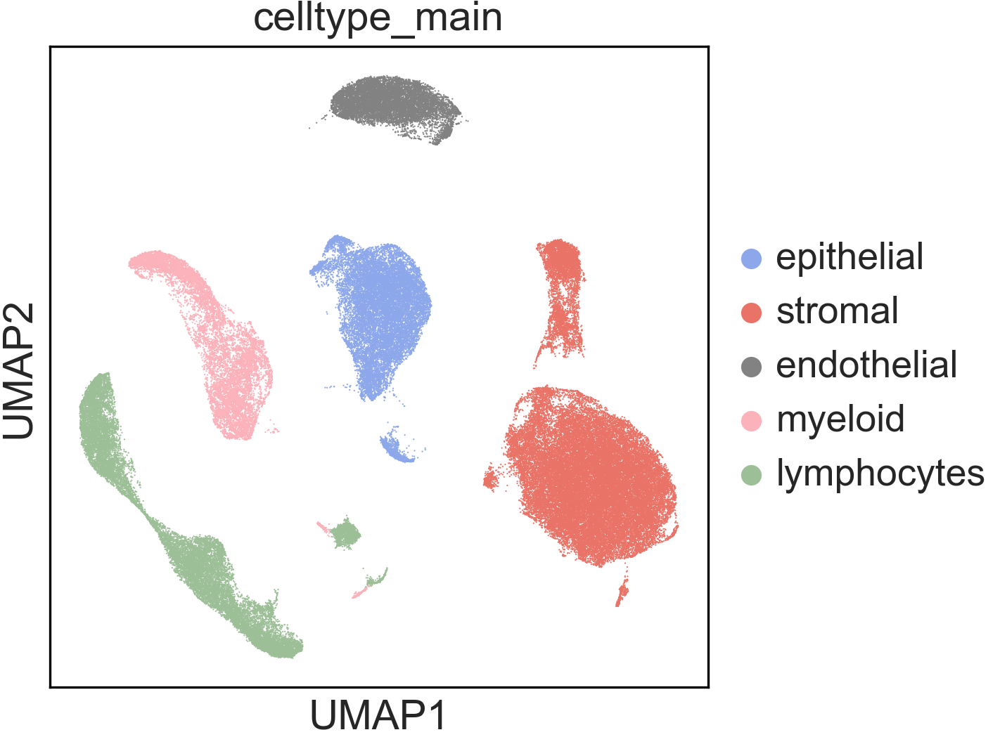

In [9]:
#re-ordering categories
main.obs["celltype_main"].cat.reorder_categories([
    "epithelial", "stromal", "endothelial", "myeloid", "lymphocytes",
],
    inplace=True)
sc.pl.umap(main, color=["celltype_main"], palette=main_palette)

---

In [10]:
def get_cluster_proportions(adata,
                            cluster_key="cluster_final",
                            sample_key="replicate",
                            drop_values=None):

    adata_tmp = adata.copy()
    sizes = adata_tmp.obs.groupby([cluster_key, sample_key]).size()
    props = sizes.groupby(level=1).apply(lambda x: 100 * x / x.sum()).reset_index() 
    props = props.pivot(columns=sample_key, index=cluster_key).T
    props.index = props.index.droplevel(0)
    props.fillna(0, inplace=True)
    
    if drop_values is not None:
        for drop_value in drop_values:
            props.drop(drop_value, axis=0, inplace=True)
    return props


def plot_cluster_proportions(cluster_props, 
                             cluster_palette=None,
                             xlabel_rotation=0,celltypes_to_keep=[]): 
    fig, ax = plt.subplots(dpi=300)
    fig.patch.set_facecolor("white")
    
    cmap = None
    if cluster_palette is not None:
        cmap = sns.palettes.blend_palette(
            cluster_palette, 
            n_colors=len(cluster_palette), 
            as_cmap=True)
   
    cluster_props.plot(
        kind="bar", 
        stacked=True, 
        ax=ax, 
        legend=None, 
        colormap=cmap
    )
    
    #tidying up the legends
    handles, labels = ax.get_legend_handles_labels()
    keep_handles, keep_labels = [], []
    for h, l in zip(handles, labels):
        if l in celltypes_to_keep:
            keep_handles.append(h)
            keep_labels.append(l)
    ax.legend(keep_handles[::-1], keep_labels[::-1],frameon=False, title="",ncol=1,fontsize=8, bbox_to_anchor=(1.01, 0.5))
    sns.despine(fig, ax)
    ax.tick_params(axis="x", rotation=xlabel_rotation, labelsize=8)
    ax.tick_params(axis="y", labelsize=8)
    ax.set_xlabel("",size=8)
    ax.set_ylabel("Proportion (%)",size=10)
    
    fig.set_size_inches(4.3, 3)
    fig.tight_layout()
    
    return fig

In [11]:
def proportion_per_patient_barplot(adata, gene="", groupby="", bar_color = "", filename=None,figdir=None):
    adata_copy = adata.copy()
    adata_copy.obs[gene] = (adata[:, [gene]].X.sum(axis=1) > 0).A1.astype(bool)
    adata_tmp = adata_copy.obs[[groupby, "PID",gene]]
    df1 = adata_tmp.groupby([groupby,"PID"])[gene].sum()
    df2 = adata_tmp.groupby([groupby,"PID"]).size()
    data_to_plot = (df1 / df2 * 100).reset_index()
    sns.set_style("white")
    fig,ax=plt.subplots(figsize=(2,2.87))
    ax = sns.boxplot(y=0,x=groupby,data = data_to_plot,
                 color=bar_color,
                 saturation=0.8,width=0.5,linewidth=0.5,fliersize=0)
    ax= sns.stripplot(x=groupby, y=0, data=data_to_plot,jitter=0,size=3, color='darkgray',edgecolor='black')
    for i,box in enumerate(ax.artists):
        if i == 1:
            box.set_edgecolor('black')
        else:
            box.set_edgecolor('black')
        # iterate over whiskers and median lines
        for j in range(6*i,6*(i+1)):
            ax.lines[j].set_color('black')
    ax.set_ylabel("Proportion (%)",fontsize=10)
    ax.set_xlabel("", fontsize=10)
    ax.set_xticklabels(ax.get_xticklabels(),rotation = 60,fontsize=8)
    ax.tick_params(axis="y", labelsize=8)
    ax.set_title("", fontsize=8)
    sns.despine()
    fig.tight_layout()
    if (filename is not None) and (figdir is not None):
        save_figure(fig, figdir, filename)

In [12]:
from matplotlib.text import Annotation
from matplotlib.legend_handler import HandlerBase
from matplotlib import patheffects
from matplotlib.colors import CSS4_COLORS, hex2color

class AnnotationHandler(HandlerBase):
    def create_artists(self, legend, artist, xdescent, ydescent,
                       width, height, fontsize, trans):
        a = Annotation(
            artist.get_text(), [width/2, height/2],
            color=artist.get_color(),
            xycoords=trans, fontsize=fontsize*0.5, 
            ha="center", va="center",
            bbox=dict(boxstyle="circle", facecolor=artist.get_bbox_patch().get_facecolor())
        )
        #a.set_path_effects(artist.get_path_effects())
        a.set_label(artist.get_label())
        return [a]
        
def add_numbered_circles_to_umap(umap_ax, circle_prefix="", circle_bg=None, circle_kwargs={}, min_cells=int, text_color="black"):
    """
    Works on a single axes at a time
    : circle_bg : If `None`, uses the color of the groups.  Otherwise, expects a color, like `'white'`. 
    : circle_kwargs : A dict to change the circle params (like `linewidth` or `edgecolor`)
    : text_color : Can be one of `None`, `"white"` or `"black"`.
    """
    allowed_colors = ["black", "white", None]
    assert text_color in allowed_colors, f"Text color needs to be in {allowed_colors}. You gave {text_color}"
    if isinstance(circle_bg, str):
        circle_bg = hex2color(CSS4_COLORS[circle_bg])
       
    # get labels
    leg = umap_ax.get_legend()
    labels = [_.get_label() for _ in leg.legendHandles]
    facecolors = np.array([_.get_facecolors()[0] for _ in leg.legendHandles])[:,:3]
    leg.remove()
    pcol = None
    for pc in umap_ax.collections:
        if pc.get_offsets().shape[0] == pc.get_facecolors().shape[0]:
            pcol = pc
            break
    else:
        raise Exception("Can't figure out which points to use")
    
    color_vector = pcol.get_facecolors()[:,:3]
    x, y = pcol.get_offsets().T
    circle_params = dict(edgecolor="black", linewidth=0.5)
    circle_params.update(**circle_kwargs)
    bbox = umap_ax.get_window_extent().transformed(umap_ax.get_figure().dpi_scale_trans.inverted())
    width, height = bbox.width, bbox.height
   
    new_handles = []
    for k, (label, group) in enumerate(zip(labels, facecolors), start=1):
        inds = (color_vector == group).all(axis=1)
        mx, my = np.median(x[inds]), np.median(y[inds])
        bg = group if circle_bg is None else circle_bg
        if not text_color:
            fontcolor = "black" if bg[:3].dot([0.299, 0.587, 0.114]) > 150/256 else "white"
        else:
            fontcolor = text_color
        stroke_color = allowed_colors[int(fontcolor == "black")]
        dx = 1.2 if inds.sum() < min_cells else 0 
        dy = 0.8 if inds.sum() < min_cells else 0 
        
        text = f"{circle_prefix}{k}"
        #text = f"{text:^5}"
        h = umap_ax.annotate(text, [mx+dx, my+dy], xycoords="data", fontsize=9, ha="center", va="center", color=fontcolor,
               bbox=dict(boxstyle="circle", facecolor=bg, **circle_params))
        hw = umap_ax.annotate(text, [mx+dx, my+dy], xycoords="data",fontsize=9, ha="center", va="center", color=fontcolor,
               bbox=dict(boxstyle="circle", facecolor="white", **circle_params))
        h.set_label(label)
        hw.set_label(label)
        h.set_path_effects([patheffects.withStroke(linewidth=1, foreground=stroke_color)])
        hw.set_path_effects([patheffects.withStroke(linewidth=1, foreground=stroke_color)])
        new_handles.append(h)
        
    umap_ax.legend(new_handles, labels, bbox_to_anchor=(1, 0.5), loc="center left", frameon=False, fontsize=8,
                   handler_map={Annotation: AnnotationHandler()}, handletextpad=0.5)

def strip_legend(ax):
    leg = ax.get_legend()
    h = leg.legendHandles
    labs = [_.get_label() for _ in h]
    leg.remove()
    return h, labs

In [13]:
#subtype = subtype name (follow the exact name as in the UMAP), 
#condition = eueVSctr, ecpVSctr, ecpaVSctr, ecoVSctr, ecpVSeco, ecpaVSec (just input 1)

def plot_gsea_nes(subtype="", condition="", n_path=10):
    #load in dataframe
    df = pd.read_csv(f"{main_dir}analysis/{sample_id}/DEG/GSEA-output/"
                     f"{subtype}-logFC.{condition}/gseapy.prerank.gene_sets.report.csv")
    
    #prepeare dataframe
    sub_df = df[df.fdr <=0.10]
    sub_df["Term_short"] = sub_df["Term"].str.extract("(.*) \(GO:")
    nes_sign = []
    for q in sub_df.nes:
        if q < 0:
            nes_sign.append('neg')
        else:
            nes_sign.append('pos')

    #palette hack
    sub_df["nes_sign"] = nes_sign
    if  sub_df["nes_sign"].nunique() == 2 :
        custom_pal = ["salmon","skyblue"]
    elif (sub_df["nes_sign"].nunique == 1) & (sub_df["nes_sign"].unique() == "neg"):
        custom_pal = ["salmon"]
    else: 
        custom_pal = ["skyblue"]
    
    #generate the figure
    fig, ax = plt.subplots(1,1, figsize=(2.5,2.1))
    ax = sns.barplot(data = sub_df[sub_df.nes >=0].sort_values(by="nes")[:n_path], 
                     x="nes", y="Term_short",
                     hue="nes_sign", palette=custom_pal,
                     dodge=False)
    ax.vlines(0, ax.get_ylim()[0],ax.get_ylim()[1],color="gray",lw=0.5)
    ax.set_xlim([-2,2])
    ax.tick_params(axis="y", labelsize=8)
    ax.legend_.remove()
    ax.set_ylabel("")
    ax.set_xlabel("")
    
    return fig

---
**Fig. 1a. Workflow schematic** 
(biorender)

---
**Fig. 1b. QC chord diagram**

Bill generated the figure and saved it in `/figures/manuscript-bill`
    

---
**Fig.1c. Markers for major cell types - violin plot**

In [17]:
from plot_funcs import marker_violins

/home/tany/.conda/envs/endometriosis/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)
EC19001-SC2100428/code/plot_funcs.py:37: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "bbox" which is no longer supported as of 3.3 and will become an error two minor releases later
  fig.savefig(out, dpi=dpi , bbox="tight")


Saved to 1c. main-marker-violin.pdf


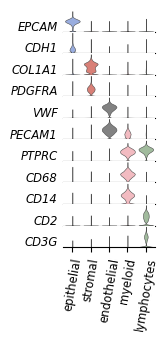

In [18]:
celltype_markers = [
    "EPCAM","CDH1",
    "COL1A1","PDGFRA",
    "VWF","PECAM1",
    "PTPRC","CD68","CD14",
    "CD2","CD3G",
    #"MZB1","DERL3", pDC markers
]

matplotlib.rcdefaults()
marker_violins(main, genes=celltype_markers, cluster_key="celltype_main",cluster_name="",
               palette = main_palette,xlabel_rotation=80,
               filename="1c. main-marker-violin", 
               figdir="v4/Fig_1"
              )

---
**Fig. 1d. Main & subclusters UMAP**

/home/tany/.conda/envs/endometriosis/lib/python3.8/site-packages/numpy/core/fromnumeric.py:746: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
EC19001-SC2100428/code/plot_funcs.py:37: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "bbox" which is no longer supported as of 3.3 and will become an error two minor releases later
  fig.savefig(out, dpi=dpi , bbox="tight")


Saved to 1d. UMAP-main.pdf


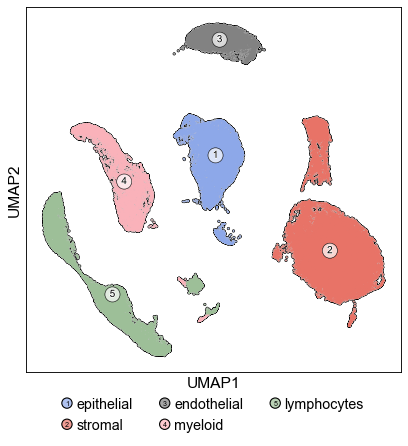

In [25]:
fig, global_ax = plt.subplots(1,1,figsize=(6,6))
params = dict(show=False, title="", add_outline=True, outline_color=("black","lightgrey"),legend_fontsize=6,
              outline_width=(0.4,0.1))
sc.pl.umap(main, 
           color="celltype_main", 
           ax=global_ax, 
           palette=main_palette,
           frameon=True, s=8, **params)
add_numbered_circles_to_umap(global_ax, text_color="black", circle_bg=None,min_cells=2000,circle_kwargs={"alpha":0.7}) 
handles,labels = strip_legend(global_ax)

global_ax.legend(handles, labels,
                 bbox_to_anchor = (0.5,-0.2),
                 loc="lower center", frameon=False,
                 ncol=3,
                 markerscale=1,
                 handler_map={Annotation: AnnotationHandler()})

sc.set_figure_params(scanpy=True, vector_friendly=True, facecolor=None)
save_figure(fig, pdir="v4/Fig_1", name="1d. UMAP-main",dpi=600)

EC19001-SC2100428/code/plot_funcs.py:37: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "bbox" which is no longer supported as of 3.3 and will become an error two minor releases later
  fig.savefig(out, dpi=dpi , bbox="tight")


Saved to 1d. UMAP-mye.pdf


EC19001-SC2100428/code/plot_funcs.py:37: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "bbox" which is no longer supported as of 3.3 and will become an error two minor releases later
  fig.savefig(out, dpi=dpi , bbox="tight")


Saved to 1d. UMAP-lym.pdf


EC19001-SC2100428/code/plot_funcs.py:37: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "bbox" which is no longer supported as of 3.3 and will become an error two minor releases later
  fig.savefig(out, dpi=dpi , bbox="tight")


Saved to 1d. UMAP-epi.pdf


EC19001-SC2100428/code/plot_funcs.py:37: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "bbox" which is no longer supported as of 3.3 and will become an error two minor releases later
  fig.savefig(out, dpi=dpi , bbox="tight")


Saved to 1d. UMAP-stro.pdf


EC19001-SC2100428/code/plot_funcs.py:37: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "bbox" which is no longer supported as of 3.3 and will become an error two minor releases later
  fig.savefig(out, dpi=dpi , bbox="tight")


Saved to 1d. UMAP-endo.pdf


EC19001-SC2100428/code/plot_funcs.py:37: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "bbox" which is no longer supported as of 3.3 and will become an error two minor releases later
  fig.savefig(out, dpi=dpi , bbox="tight")


Saved to 1d. UMAP-org.pdf


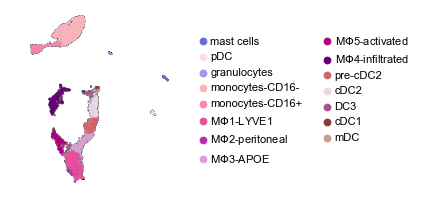

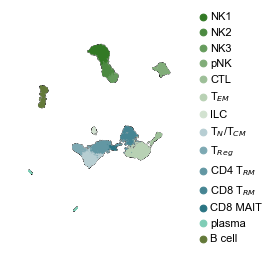

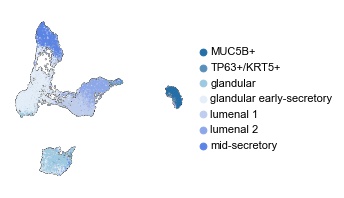

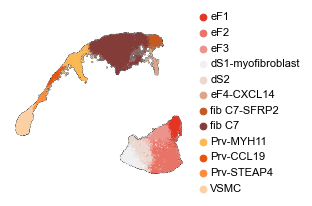

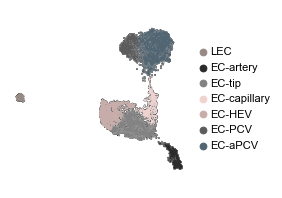

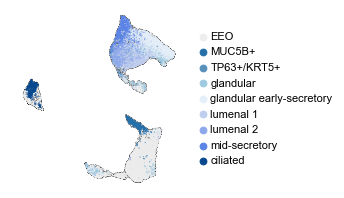

In [20]:
adatas = [mye, lym, epi, stro, endo, org]
pals = [mye_palette,lym_palette, epi_palette, stro_palette, endo_palette, org_palette]
names = ["mye", "lym", "epi", "stro", "endo", "org"]


for i,p,name in zip(adatas[2],pals[2],names[2]):
    #sc.pl.umap(i, color=["subtypes"], palette=p)
    fig, ax = plt.subplots(1,1,figsize=(5,3))
    sc.pl.umap(i, color = ["subtypes"],
               legend_fontsize= 10,title="",
               palette=p,
               s=5, 
               add_outline=True,
               outline_color=("black","lightgrey"),
               outline_width=(0.2,0.05),
               frameon=False,
               show=False,
               ax=ax)
    fix_aspect_scatter_with_legend(fig)
    save_figure(fig,pdir="v4/Fig_1", name=f"1d. UMAP-{name}")

---
**Fig. 1a.** detailed workflow (biorender) <br>
**Fig. S1b.** representative images of tissue biopsy

---
**Fig. S1c.** UMAP - QC for batch correction

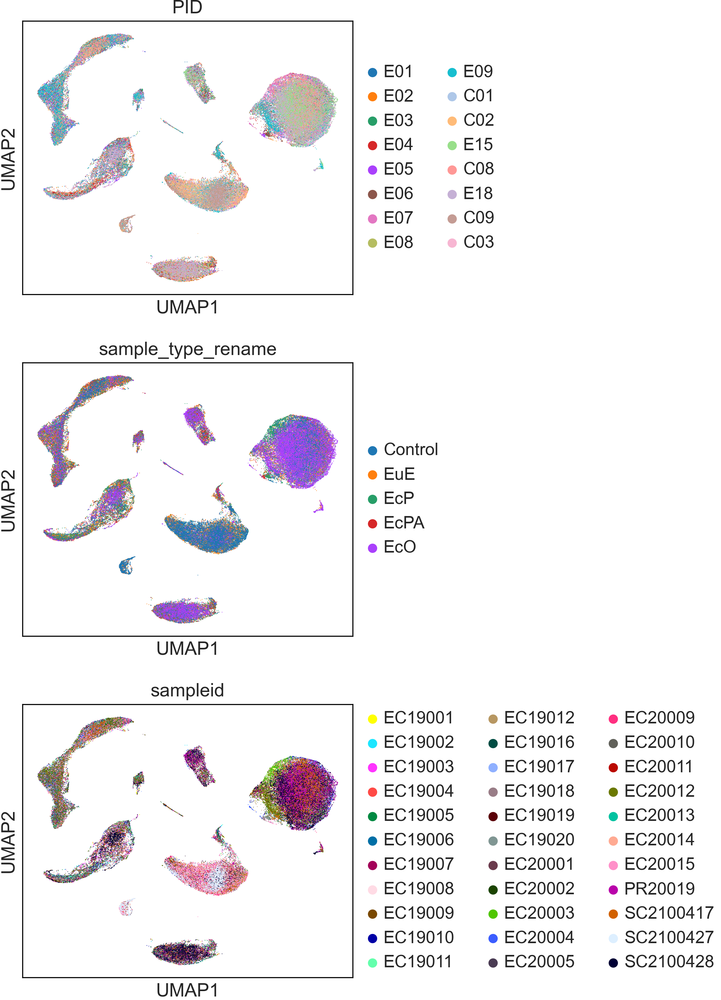

In [34]:
sc.pl.umap(main, color=["PID","sample_type_rename","sampleid"], ncols=1)

Saved to S1d. UMAP-QC-batch-correction-main.pdf


EC19001-SC2100428/code/plot_funcs.py:37: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "bbox" which is no longer supported as of 3.3 and will become an error two minor releases later
  fig.savefig(out, dpi=dpi , bbox="tight")


Saved to S1d. UMAP-QC-batch-correction-mye.pdf


EC19001-SC2100428/code/plot_funcs.py:37: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "bbox" which is no longer supported as of 3.3 and will become an error two minor releases later
  fig.savefig(out, dpi=dpi , bbox="tight")


Saved to S1d. UMAP-QC-batch-correction-lym.pdf


EC19001-SC2100428/code/plot_funcs.py:37: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "bbox" which is no longer supported as of 3.3 and will become an error two minor releases later
  fig.savefig(out, dpi=dpi , bbox="tight")


Saved to S1d. UMAP-QC-batch-correction-epi.pdf


EC19001-SC2100428/code/plot_funcs.py:37: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "bbox" which is no longer supported as of 3.3 and will become an error two minor releases later
  fig.savefig(out, dpi=dpi , bbox="tight")


Saved to S1d. UMAP-QC-batch-correction-stro.pdf


EC19001-SC2100428/code/plot_funcs.py:37: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "bbox" which is no longer supported as of 3.3 and will become an error two minor releases later
  fig.savefig(out, dpi=dpi , bbox="tight")


Saved to S1d. UMAP-QC-batch-correction-endo.pdf


EC19001-SC2100428/code/plot_funcs.py:37: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "bbox" which is no longer supported as of 3.3 and will become an error two minor releases later
  fig.savefig(out, dpi=dpi , bbox="tight")


Saved to S1d. UMAP-QC-batch-correction-org.pdf


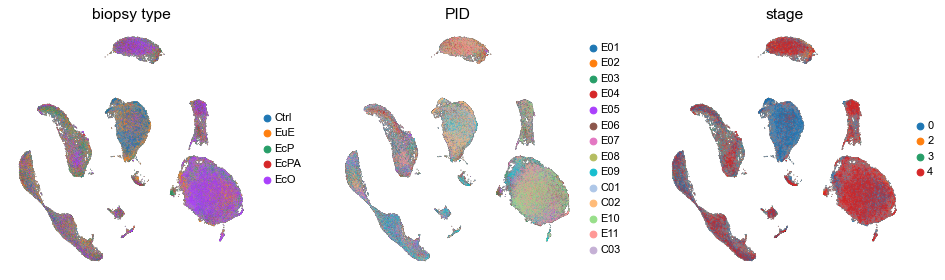

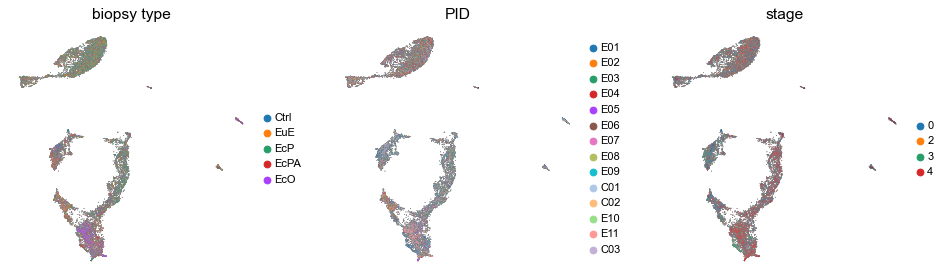

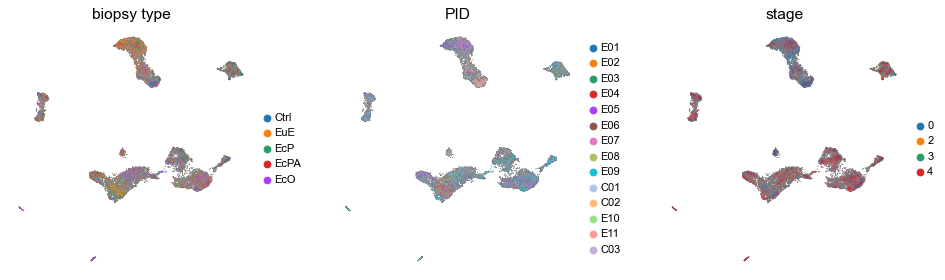

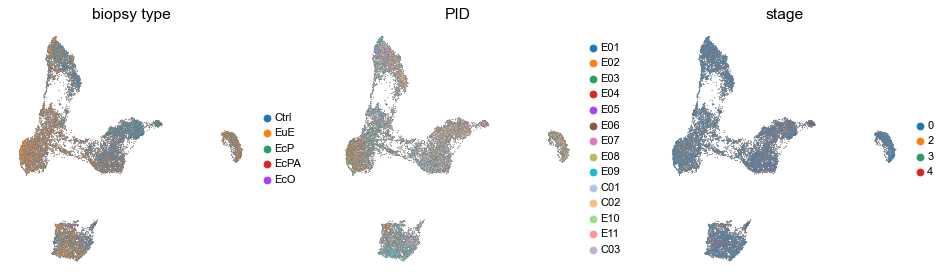

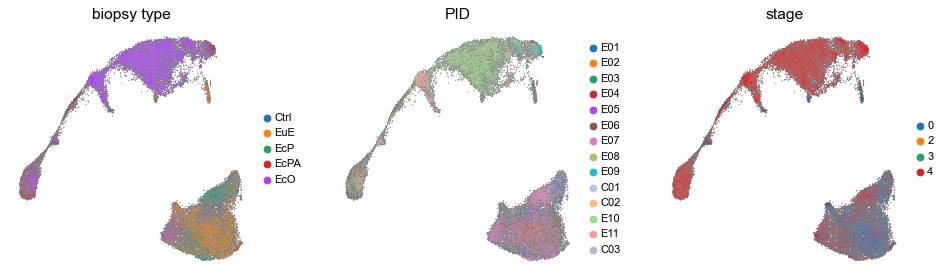

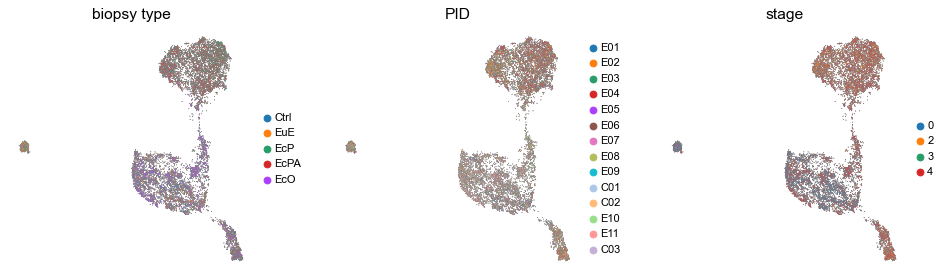

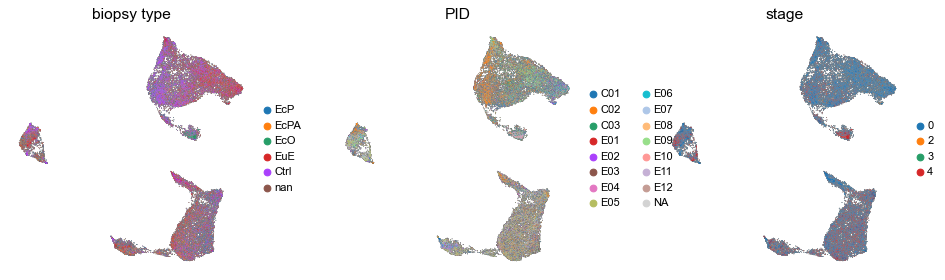

In [28]:
adatas = [main, mye, lym, epi, stro, endo, org]
names = ["main","mye", "lym", "epi", "stro", "endo", "org"]

for i,name in zip(adatas,names):
    fig = sc.pl.umap(i, color = ["sample_type_rename","PID","stage"],
                     legend_fontsize= 10, title=["biopsy type","PID"],
                     s=1, 
                     add_outline=True,
                     outline_color=("black","lightgrey"),
                     outline_width=(0.2,0.05),
                     frameon=False,
                     show=False,return_fig=True)
    sc.set_figure_params(scanpy=True, vector_friendly=True, facecolor=None)
    save_figure(fig,pdir="v4/Fig_S1", name=f"S1d. UMAP-QC-batch-correction-{name}")

EC19001-SC2100428/code/plot_funcs.py:37: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "bbox" which is no longer supported as of 3.3 and will become an error two minor releases later
  fig.savefig(out, dpi=dpi , bbox="tight")


Saved to S1d. UMAP-QC-batch-correction-epi.pdf


EC19001-SC2100428/code/plot_funcs.py:37: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "bbox" which is no longer supported as of 3.3 and will become an error two minor releases later
  fig.savefig(out, dpi=dpi , bbox="tight")


Saved to S1d. UMAP-QC-batch-correction-org.pdf


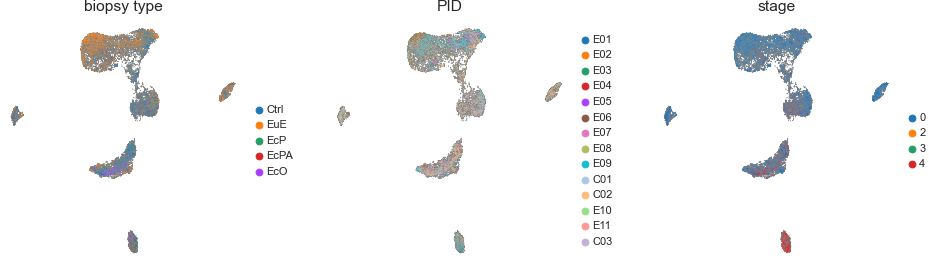

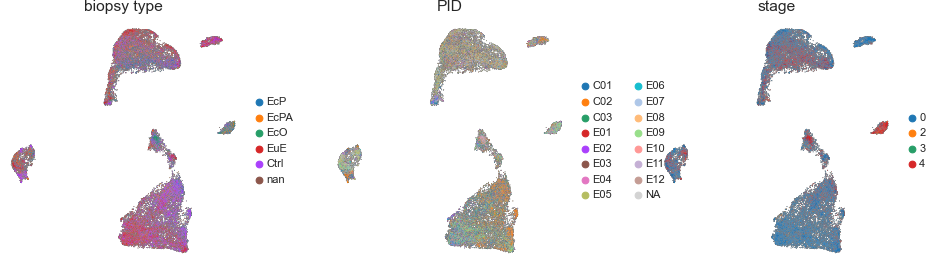

In [23]:
for i,name in zip(radatas,rnames):
    fig = sc.pl.umap(i, color = ["sample_type_rename","PID","stage"],
                     legend_fontsize= 10, title=["biopsy type","PID","stage"],
                     s=1, 
                     add_outline=True,
                     outline_color=("black","lightgrey"),
                     outline_width=(0.2,0.05),
                     frameon=False,
                     show=False,return_fig=True)
    sc.set_figure_params(scanpy=True, vector_friendly=True, facecolor=None)
    save_figure(fig,pdir="v4/Fig_S1", name=f"S1d. UMAP-QC-batch-correction-{name}")

In [22]:
noHarm = sc.read(f"{main_dir}/data/h5ad/{sample_id}/{sample_id}-combined-noHarmony-20220106.h5ad")

In [23]:
noHarm.obs["sample_type_rename"] = noHarm.obs.sample_type.map({
    "Eutopic" : "EuE",
    "Eutopic Normal" : "Ctrl",
    "Ectopic" : "EcP",
    "Ectopic Adj" : "EcPA",
    "Ectopic Ovary": "EcO",
}).astype("category")

noHarm.obs["sample_type_rename"].cat.reorder_categories(
    ["Ctrl", "EuE", "EcP", "EcPA", "EcO"],inplace=True)

noHarm.obs["PID"] = noHarm.obs.Patient_id.map({
    "04":"E01",
    "05":"E02",
    "06":"E03",
    "08":"E04",
    "10":"E05",
    "11":"E06",
    "13":"E07",
    "14":"E08",
    "15":"E09",
    "24":"E10", #this is actually 106.22, wrong annotation at the beginning
    "31":"E11",
    "07":"E12",
    "17":"C01",
    "19":"C02",
    "795":"C03",
    "29":"C04",
    "32":"C05"
}).astype("category")

EC19001-SC2100428/code/plot_funcs.py:37: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "bbox" which is no longer supported as of 3.3 and will become an error two minor releases later
  fig.savefig(out, dpi=dpi , bbox="tight")


Saved to S1d. UMAP-QC-noHarmony-main.pdf


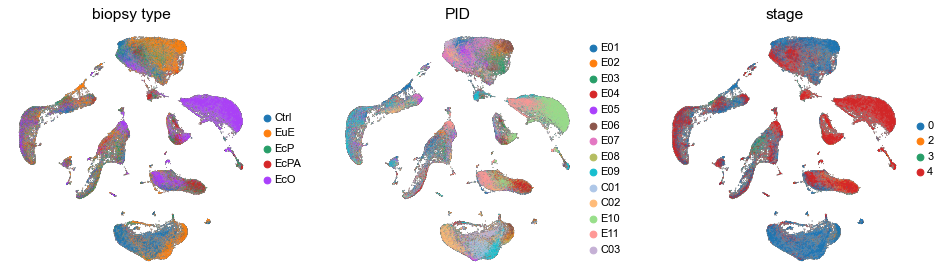

In [26]:
fig = sc.pl.umap(noHarm, color = ["sample_type_rename","PID","stage"],
                 legend_fontsize= 10, title=["biopsy type","PID","stage"],
                 s=1, 
                 add_outline=True,
                 outline_color=("black","lightgrey"),
                 outline_width=(0.2,0.05),
                 frameon=False,
                 show=False,return_fig=True)
sc.set_figure_params(scanpy=True, vector_friendly=True, facecolor=None)
save_figure(fig,pdir="v4/Fig_S1", name=f"S1d. UMAP-QC-noHarmony-main")

---
**Fig. S2.** Pie distribution of celltype

In [82]:
from matplotlib.patches import Patch, Wedge, Circle
from matplotlib.legend_handler import HandlerPatch
class WedgeHandler(HandlerPatch):
    def create_artists(self, legend, orig_handle,
                       xdescent, ydescent, width, height, fontsize, trans):
        patch = Wedge(
            [xdescent, ydescent], width, 0, np.arctan(2*height/width)*180/np.pi, 
            facecolor=orig_handle[0], lw=0.9,
            edgecolor="k"
        )
        return [patch]
def pies(p, palette=sns.mpl_palette("Dark2", 6)):
    celltypes = p["celltype"].unique()
    n_celltypes = len(celltypes)
    sample_types = p["sample_type"].unique()
    n_sample_types = len(sample_types)
    patients = p["patient"].unique()
    n_patients = len(patients)
    max_rows = (p.groupby(["sample_type", "patient"]).agg(sum) > 0).groupby("sample_type").sum().max().values.ravel()[0]
    print(max_rows)
    fig, axs = plt.subplots(
        max_rows + 1, n_sample_types, 
        dpi=200, figsize=(n_sample_types, n_patients+1),
        gridspec_kw=dict(hspace=0, wspace=0)
    )
    for ax in axs.flat:
        ax.set_axis_off()
    agg_data = p.groupby(["sample_type", "celltype"]).agg(np.mean)
    for k, st in enumerate(sample_types):
        idx = agg_data.index.get_level_values("sample_type") == st
        axs[0, k].set_axis_on()
        axs[0, k].pie(
            agg_data.loc[idx].values.ravel(),
            normalize=True, #not needed in theory but good to handle floating point error
            colors=palette,
            wedgeprops=dict(lw=1, ec="k"),
            #labels = celltypes
        )
        axs[0, k].set_title(st)
    for j, st in enumerate(sample_types):
        i = 1
        for pat in patients:
            d = p[p.patient.isin([pat]) & p.sample_type.isin([st])]
            if sum(d["proportion"] > 0) < 1: 
                continue
            axs[i, j].set_axis_on()
            axs[i, j].pie(
                d["proportion"], 
                normalize=True, #not needed in theory but good to handle floating point error
                colors=palette,
                wedgeprops=dict(lw=1, ec="k"),
                #labels = celltypes
            )
            axs[i, j].text(0.75, 0.85, pat, fontsize="x-small", transform=axs[i,j].transAxes)
            i += 1
        #axs[i,0].set_ylabel(pat)
    line = plt.Line2D([0.05, 0.95],[0.84, 0.84], transform=fig.transFigure, color="black", lw=1)
    fig.add_artist(line)
    legend_elements = [(c, ct) for c, ct in zip(palette, celltypes)]
    axs[7, -2].legend(
        legend_elements, list(celltypes), ncol=1,
        loc="upper center", frameon=False, bbox_to_anchor=(1.25, 0.5),
        handler_map={tuple: WedgeHandler()}, handletextpad=0.5
    )
    return fig
def fix_all_annos(adata):
    adata.obs["celltype_main"].cat.reorder_categories([
        "epithelial", "stromal", "endothelial", "myeloid", "lymphocytes"
    ],
        inplace=True
    )
    adata.obs["sample_type_rename"].cat.reorder_categories(
        ["Control", "EuE", "EcP", "EcPA", "EcO"],inplace=True
    )
    adata.obs["sample_type_rename"].cat.remove_unused_categories(inplace=True)
    adata.obs["celltype_main"].cat.remove_unused_categories(inplace=True)
    adata.obs["PID"].cat.remove_unused_categories(inplace=True)
def prep_props(adata, ct_key="celltype_main", pt_key="Patient_id", st_key="sample_type_rename"):
    n_ct = len(adata.obs[ct_key].unique())
    props = adata.obs.groupby([pt_key, st_key, ct_key]).size().reset_index()
    props.columns = ["patient", "sample_type", "celltype", "proportion"]
    norms = np.repeat(props.groupby(["patient", "sample_type"]).agg(sum).values.ravel(), n_ct)
    print(len(norms))
    props.proportion /= norms
    return props

350
9


EC19001-SC2100428/code/plot_funcs.py:37: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "bbox" which is no longer supported as of 3.3 and will become an error two minor releases later
  fig.savefig(out, dpi=dpi , bbox="tight")


Saved to S2a.pies_per PID.pdf


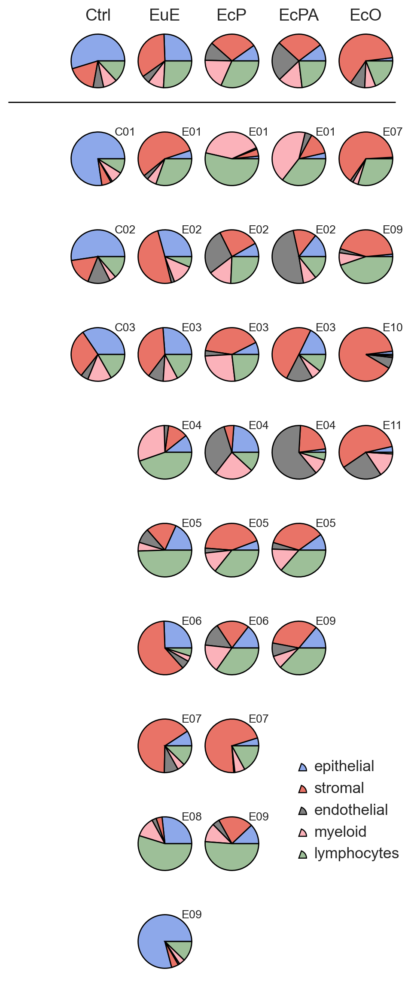

In [83]:
p = prep_props(main, ct_key="celltype_main", pt_key="PID")
fig = pies(p, palette=main_palette)
save_figure(fig, pdir="v4/Fig_S2",name="S2a.pies_per PID")

---
**Fig. S3.** IMC images of each panel

---
**Extended Data 1a-b.** similarities between sc-RNAseq vs bs-RNAseq pearson correlation scatter plot <br>
**Extended Data 1c.** difference between sc-RNAseq vs bs-RNAseq volcano plot (edgeR)

---
**Extended Data 2a** Representative HE image classification for Ctrl and EuE <br>
**Extended Data 2b** HE proportion

In [78]:
#read data
data = pd.read_csv(f"{main_dir}analysis/Endo-Tissue-EC19001-SC2100428/HEstaining/HE_Epi-Proportion.csv")

#transform to long form
df = pd.melt(data, id_vars=["Name","Group"],value_name="Epithelial proportion (%)")

#tidy it up
df["Group"] = df["Group"].astype("category")
df.Group.cat.reorder_categories(["Control","Endometriosis"],inplace=True)

#remove outlier
df1 = df[~df.Name.str.contains("106.32")]

In [49]:
df2 = df1[df1.variable == "Classifier 2"]
control = df2[df2.Group == "Control"]["Epithelial proportion (%)"]
Endo = df2[df2.Group == "Endometriosis"]["Epithelial proportion (%)"]

In [52]:
#from scipy import stats
stats.ttest_ind(control, Endo, equal_var=False)

Ttest_indResult(statistic=3.4728907217980853, pvalue=0.013521968373360548)

EC19001-SC2100428/code/plot_funcs.py:37: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "bbox" which is no longer supported as of 3.3 and will become an error two minor releases later
  fig.savefig(out, dpi=dpi , bbox="tight")


Saved to E1b. HE_class-eutopic.pdf


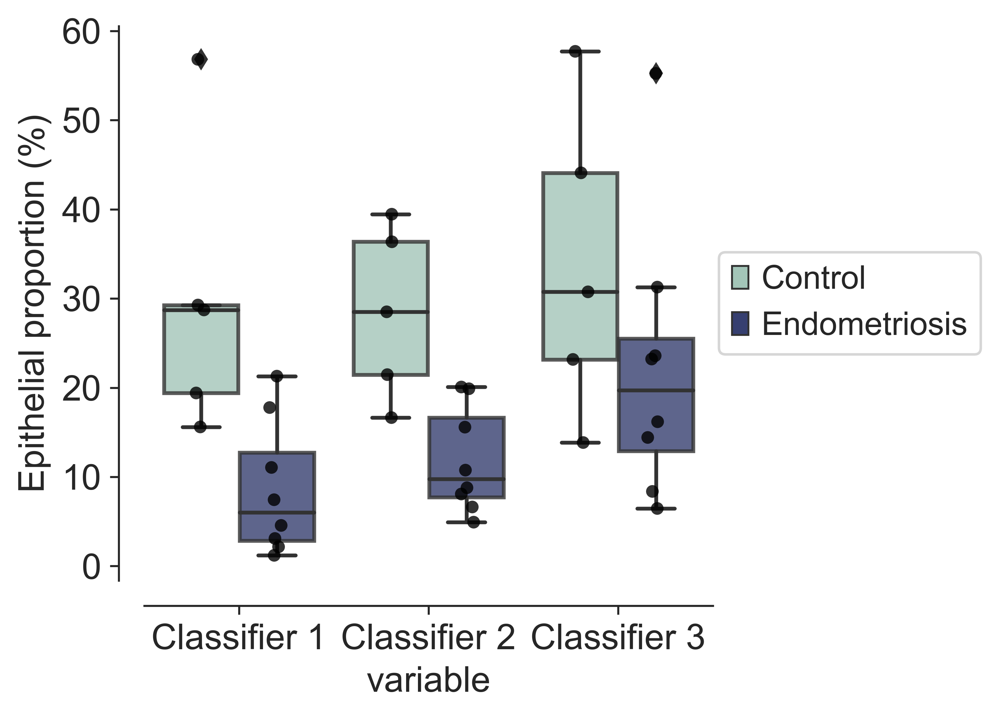

In [99]:
sns.set_style("ticks")
from matplotlib.colors import hex2color
colors=["#9dcbb9","#2c387a"]
pal = [hex2color(v) for v in colors]

fig,ax = plt.subplots(figsize=(4,4),dpi=600)
sns.boxplot(x="variable", y="Epithelial proportion (%)", hue="Group", data=df1, 
            palette=pal,boxprops=dict(alpha=.8), ax=ax)
sns.stripplot(x='variable', y="Epithelial proportion (%)", hue='Group', data=df1,
                jitter=True, dodge=True, marker='o', palette=["k","k"], alpha=0.8,
                ax=ax)

sns.despine(offset=10, ax=ax)
handles, labels = ax.get_legend_handles_labels()
l = plt.legend(handles[0:2], labels[0:2],loc=7, bbox_to_anchor= (1.5,0.5))
save_figure(fig, pdir="v4/Fig_E1",name="E1b. HE_class-eutopic")

---
**Extended Data 2c** Fibroblast in EuE vs Ctrl

EC19001-SC2100428/code/plot_funcs.py:37: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "bbox" which is no longer supported as of 3.3 and will become an error two minor releases later
  fig.savefig(out, dpi=dpi , bbox="tight")


Saved to S2b. UMAP-main-TOP2A-Ctrl.pdf


/home/tany/.conda/envs/endometriosis/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)
EC19001-SC2100428/code/plot_funcs.py:37: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "bbox" which is no longer supported as of 3.3 and will become an error two minor releases later
  fig.savefig(out, dpi=dpi , bbox="tight")


Saved to S2b. UMAP-main-TOP2A-EuE.pdf


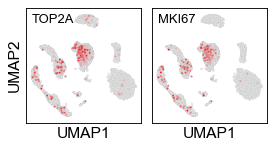

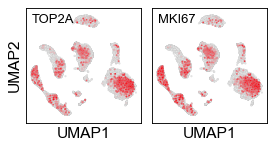

In [37]:
from plot_funcs import scatter_1by2

get_st = ["Ctrl", "EuE"]
for st in get_st:
    scatter_1by2(main[main.obs.sample_type_rename == st], 
                 ["TOP2A","MKI67"],
                 markersize=10,
                 filename=f"S2b. UMAP-main-TOP2A-{st}",
                 figdir="v4/Fig_S2"
                )

/home/tany/.conda/envs/endometriosis/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)
EC19001-SC2100428/code/plot_funcs.py:37: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "bbox" which is no longer supported as of 3.3 and will become an error two minor releases later
  fig.savefig(out, dpi=dpi , bbox="tight")


Saved to S2b. UMAP-stro-TOP2A-Ctrl.pdf


/home/tany/.conda/envs/endometriosis/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)
EC19001-SC2100428/code/plot_funcs.py:37: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "bbox" which is no longer supported as of 3.3 and will become an error two minor releases later
  fig.savefig(out, dpi=dpi , bbox="tight")


Saved to S2b. UMAP-stro-TOP2A-EuE.pdf


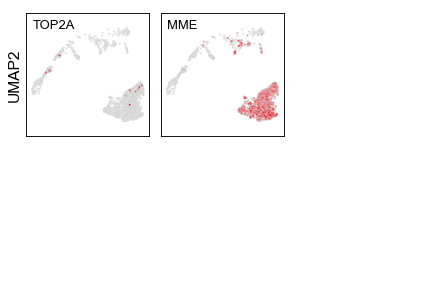

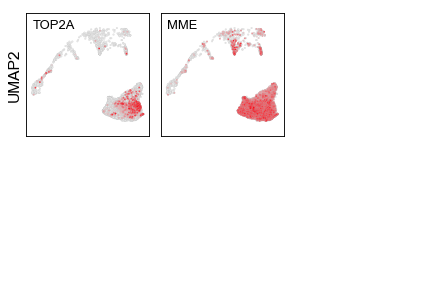

In [38]:
from plot_funcs import scatter_2by3

get_st = ["Ctrl", "EuE"]
for st in get_st:
    scatter_2by3(stro[stro.obs.sample_type_rename == st], 
                 ["TOP2A","MME"],
                 markersize=10,
                 filename=f"S2b. UMAP-stro-TOP2A-{st}",
                 figdir="v4/Fig_S2",
                 ext="pdf",
                )

---
**Extended Data 2d** cell cycle props in eutopic fib

Saved to S2c. props_eF-cellcycle.pdf


EC19001-SC2100428/code/plot_funcs.py:37: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "bbox" which is no longer supported as of 3.3 and will become an error two minor releases later
  fig.savefig(out, dpi=dpi , bbox="tight")


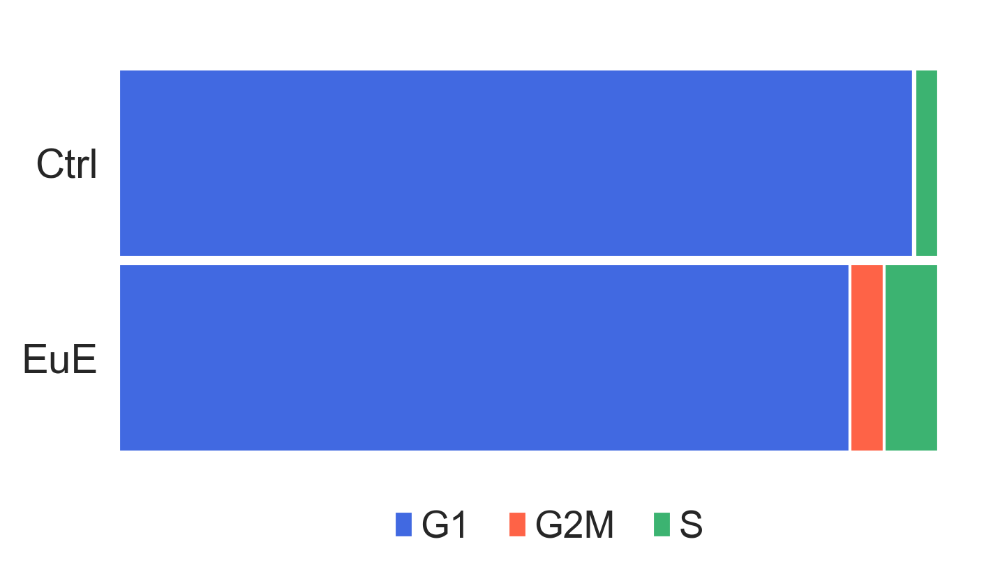

In [64]:
from plot_funcs import plot_celltype_proportions
sns.set_style("white")
endo_fib = ["eF1","eF2","eF3","dS1-myofibroblast","dS2","eF4-CXCL14"]
adata = stro[stro.obs.subtypes.isin(endo_fib)]
props = get_cluster_proportions(adata[adata.obs.sample_type_rename.isin(get_st)], 
                                cluster_key="phase",sample_key="sample_type_rename")
fig = plot_celltype_proportions(props,cluster_palette=sns.color_palette(["royalblue","tomato","mediumseagreen"]));
save_figure(fig,pdir="v4/Fig_S2", name="S2c. props_eF-cellcycle")

/home/tany/.conda/envs/endometriosis/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


Saved to S2c. props_eF2-proliferative-cellcycle.pdf


EC19001-SC2100428/code/plot_funcs.py:37: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "bbox" which is no longer supported as of 3.3 and will become an error two minor releases later
  fig.savefig(out, dpi=dpi , bbox="tight")


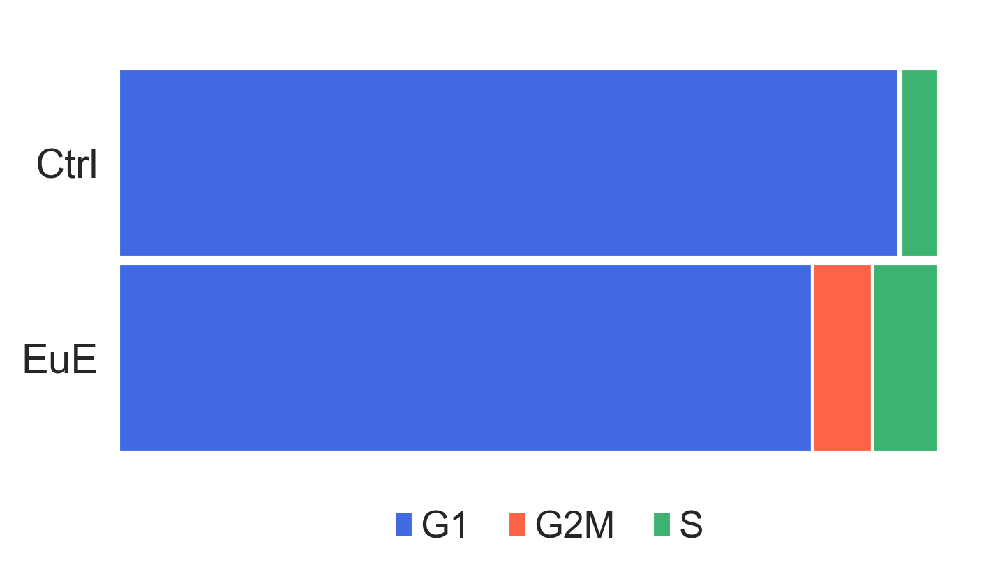

In [40]:
from plot_funcs import plot_celltype_proportions
sns.set_style("white")
adata = stro[stro.obs.subtypes.str.contains("eF2")]
props = get_cluster_proportions(adata[adata.obs.sample_type_rename.isin(get_st)], 
                                cluster_key="phase",sample_key="sample_type_rename")
fig = plot_celltype_proportions(props,cluster_palette=sns.color_palette(["royalblue","tomato","mediumseagreen"]));
save_figure(fig,pdir="v4/Fig_S2", name="S2c. props_eF2-proliferative-cellcycle")

---
**Extended Data 2e** IMC for KI67 in Ctlr vs EuE (napari)

---
**Extended Data 2f** Correlation matrix

/home/tany/.conda/envs/endometriosis/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)
    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_PID']`
Trying to set attribute `.uns` of view, copying.
EC19001-SC2100428/code/plot_funcs.py:37: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "bbox" which is no longer supported as of 3.3 and will become an error two minor releases later
  fig.savefig(out, dpi=dpi , bbox="tight")


Saved to S2d. corr-matrix_eutopic.pdf


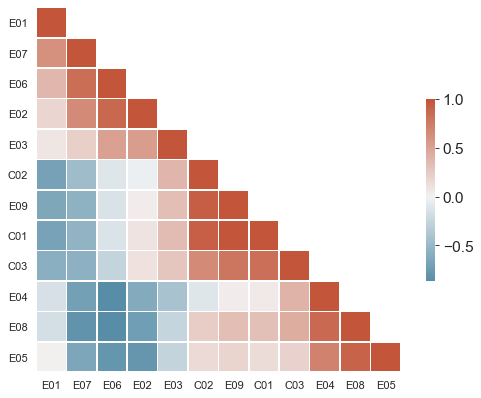

In [41]:
#define dataset and calculate correlation matrix (pearson correlation)
adata = main[main.obs.sample_type_rename.isin(["EuE","Ctrl"])]
sc.tl.dendrogram(adata, groupby="PID",optimal_ordering=True)

#create dataframe for matrix generation
index = adata.uns["dendrogram_PID"]['categories_idx_ordered']
corr_matrix = adata.uns["dendrogram_PID"]['correlation_matrix']
corr_matrix = corr_matrix[index, :]
corr_matrix = corr_matrix[:, index]
labels = list(adata.obs["PID"].cat.categories)
labels = np.array(labels).astype('str')[index]

corr = pd.DataFrame(corr_matrix)
corr.index = labels
corr.columns = labels

#plotting
mask = np.triu(np.ones_like(corr, dtype=bool),k=1)
#mask = np.tril(np.ones_like(corr, dtype=bool),k=-1)

cmap = sns.diverging_palette(230, 20, as_cmap=True)

f, ax = plt.subplots(figsize=(8, 6))
sns.heatmap(corr, mask=mask, cmap=cmap, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5}
           )
ax.tick_params(axis="y", labelrotation = 0, labelsize=10)
ax.tick_params(axis="x", labelrotation = 0, labelsize=10)
#ax.invert_yaxis()
save_figure(f, pdir="v4/Fig_S2",name="S2d. corr-matrix_eutopic")

---
**Extended Data 2g.** OGN proportion barplot

In [65]:
endo_fib = ["eF1","eF2","eF3","dS1-myofibroblast","dS2","eF4-CXCL14"]
adata = stro[stro.obs.subtypes.isin(endo_fib)]

/home/tany/.conda/envs/endometriosis/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


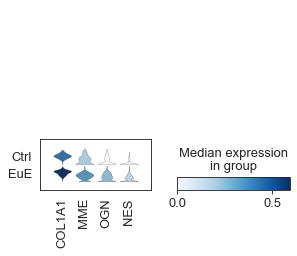

Saved to E1d. Fibroblast_OGN.pdf


EC19001-SC2100428/code/plot_funcs.py:37: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "bbox" which is no longer supported as of 3.3 and will become an error two minor releases later
  fig.savefig(out, dpi=dpi , bbox="tight")


In [101]:
f, ax = plt.subplots(1,1,figsize=(4,3))
sc.pl.stacked_violin(adata[(adata.obs.subtypes=="dS2")&(adata.obs.sample_type_rename.isin(["Ctrl","EuE"]))], 
                     var_names=["COL1A1","MME","OGN","NES"],groupby="sample_type_rename",standard_scale='var', ax=ax)
save_figure(f,pdir="v4/Fig_E1", name="E1d. Fibroblast_OGN")

---
**Extended Data 2h.** IMC for *OGN* expression on tissue (napari)

---
**Fig 2a** stro UMAP

 -- use previously generated UMAP for Fig 1d

---
**Fig 2b** mural cells markers

/home/tany/.conda/envs/endometriosis/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


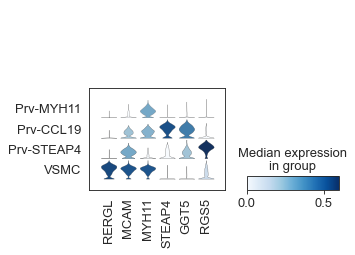

In [117]:
f, ax = plt.subplots(1,1,figsize=(4,3))
sc.pl.stacked_violin(stro[stro.obs.subtypes.isin(["Prv-STEAP4","Prv-MYH11","Prv-CCL19","VSMC"])],
                     var_names=["RERGL","MCAM","MYH11","STEAP4","GGT5","RGS5"],groupby="subtypes", standard_scale="var", ax=ax)
#save_figure(f,pdir="v4/Fig_2", name="2b. pericytes_markers")

---
**Fig 2c** endo UMAP

-- use previously generated UMAP for Fig 1d

---
**Fig 2d** CCL19 expression

In [56]:
def props_exp_plot (adata, celltype="", subtypes="", gene="", bar_color="", filename=None, figdir=None):
    cluster_props = get_cluster_proportions(adata,cluster_key="subtypes",sample_key="sample_type_rename")
    props = cluster_props[subtypes]
    subset = adata[adata.obs.subtypes == subtypes].copy()
    gene_of_interest = [gene] 
    df = sc.get.obs_df(subset, ["sample_type_rename"] + gene_of_interest)
    fig = plt.figure(figsize=(2.6,4))
    sample_types = subset.obs["sample_type_rename"].unique()
    N = len(sample_types)
    gs = plt.GridSpec(2, N, height_ratios=[1,5.8], hspace=0.1,wspace=0.4)
    swarm_ax = fig.add_subplot(gs[1:, :])
    celltype_a_axs = [fig.add_subplot(gs[0, k]) for k in range(N)]
    sns.swarmplot(x="sample_type_rename", y=gene, data=df, size=2.5, alpha= 0.6, ax=swarm_ax)
    median_width = 0.5
    for tick, text in zip(swarm_ax.get_xticks(), swarm_ax.get_xticklabels()):
        sample_name = text.get_text()
        median_val = df[df["sample_type_rename"]==sample_name].iloc[:,1].mean()
        swarm_ax.plot([tick-median_width/2, tick+median_width/2], [median_val, median_val],
                    lw=1, color='k')
    swarm_ax.set_ylabel("log (normalized counts)",fontsize=8,)
    swarm_ax.set_xlabel("", fontsize=8)
    swarm_ax.tick_params(axis="both", labelsize=8)
    swarm_ax.set_title("", fontsize=8)
    xlim=(np.max(props.values)*1.2)
    for k, sample_type in enumerate(sample_types):
        celltype_a_axs[k].barh(y=1, width=props.values[k], height=0.6,color=bar_color)
        celltype_a_axs[k].set_xlim(0,xlim)
        celltype_a_axs[k].set_ylim(0.5,1.8)
        celltype_a_axs[k].text(1.2, 1.5, round(props.values[k],2),fontsize=8)
        celltype_a_axs[k].set_yticklabels("")
        celltype_a_axs[k].set_xticklabels([""],fontsize=8)
    celltype_a_axs[0].set_ylabel(f"prop. \nin {celltype} (%)",fontsize=8)
    sns.despine()
    if (filename is not None) and (figdir is not None):
        save_figure(fig, figdir, filename)

/home/tany/.conda/envs/endometriosis/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)
/home/tany/.conda/envs/endometriosis/lib/python3.8/site-packages/seaborn/categorical.py:1296: UserWarning: 81.3% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/home/tany/.conda/envs/endometriosis/lib/python3.8/site-packages/seaborn/categorical.py:1296: UserWarning: 80.0% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/home/tany/.conda/envs/endometriosis/lib/python3.8/site-packages/seaborn/categorical.py:1296: UserWarning: 42.4% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(ms

Saved to 2d. swarm_proportion_pericytes.pdf


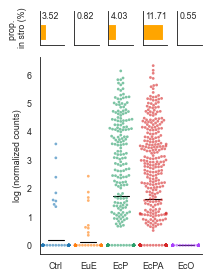

In [114]:
sns.set_style("white")
props_exp_plot(stro, celltype="stro",subtypes="Prv-CCL19",gene="CCL19",bar_color="orange",
              filename="2d. swarm_proportion_pericytes",figdir="v4/Fig_2"
              )

---
**Fig 2e** pericytes-endothelial angiogenesis: upregulated in peritoneal pericytes

/home/tany/.conda/envs/endometriosis/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)
EC19001-SC2100428/code/plot_funcs.py:37: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "bbox" which is no longer supported as of 3.3 and will become an error two minor releases later
  fig.savefig(out, dpi=dpi , bbox="tight")


Saved to 2e. dotplot-pericyte_angiogenesis.pdf


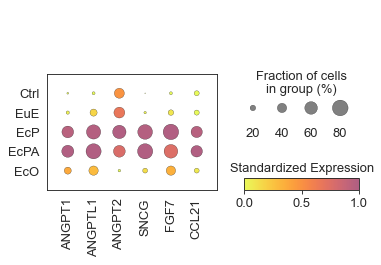

In [112]:
import cmocean as cmo
#pericytes_CCL19 role in modulating endothelial phenotypes
short_list = ["ANGPT1","ANGPTL1","ANGPT2","SNCG","FGF7","CCL21"]
amp = cmo.tools.crop_by_percent(cmo.cm.thermal_r, 50, which='max', N=None)

f, ax = plt.subplots(1,1,figsize=(5,3))
sc.pl.dotplot(stro[stro.obs.subtypes.str.contains("Prv-CCL19")], 
                 var_names=short_list,cmap=amp,standard_scale="var",colorbar_title="Standardized Expression",
                 groupby="sample_type_rename",ax=ax,show=False)
save_figure(f,pdir="v4/Fig_2", name="2e. dotplot-pericyte_angiogenesis")

In [105]:
stro[stro.obs.subtypes == "Prv-CCL19"].obs.sample_type_rename.value_counts()

/home/tany/.conda/envs/endometriosis/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


EcPA    478
EcP     316
EcO      95
Ctrl     91
EuE      90
Name: sample_type_rename, dtype: int64

---
**Fig 2g** pericytes-endothelial angiogenesis in tip (g)

{'mainplot_ax': <AxesSubplot:>,
 'size_legend_ax': <AxesSubplot:title={'center':'Fraction of cells\nin group (%)'}>,
 'color_legend_ax': <AxesSubplot:title={'center':'Standardized Expression'}>}

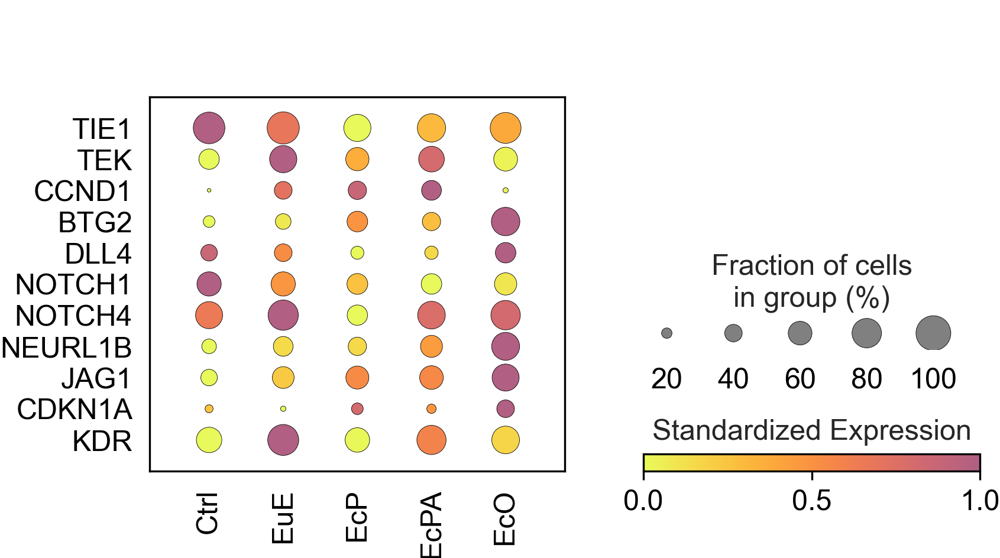

In [19]:
#induce angiogenesis in endothelial-tip
import cmocean as cmo
amp = cmo.tools.crop_by_percent(cmo.cm.thermal_r, 50, which='max', N=None)
short_list = ["TIE1","TEK","CCND1","BTG2","DLL4","NOTCH1","NOTCH4"]

f, ax = plt.subplots(1,1,figsize=(6,3.5))
sc.pl.dotplot(endo[endo.obs.subtypes.str.contains("tip")], 
                 var_names=short_list,cmap=amp,standard_scale="var",colorbar_title="Standardized Expression",dot_max=1,
                 groupby="sample_type_rename", swap_axes=True, ax=ax, show=False)
#save_figure(f,pdir="v4/Fig_2", name="2g. dotplot-EC-tip")

---
**Fig 2h** pericytes-endothelial immune-trafficking in EC_PCV (g)

/home/tany/.conda/envs/endometriosis/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)
EC19001-SC2100428/code/plot_funcs.py:37: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "bbox" which is no longer supported as of 3.3 and will become an error two minor releases later
  fig.savefig(out, dpi=dpi , bbox="tight")


Saved to 2h. dotplot-EC-aPCV.pdf


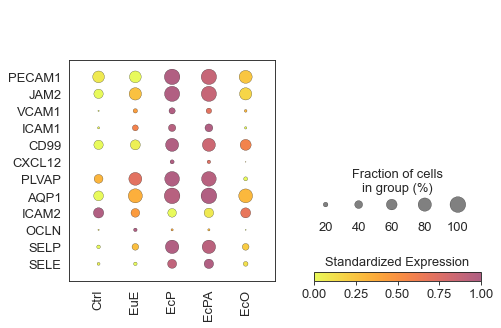

In [113]:
short_list = ["PECAM1","JAM2","VCAM1","ICAM1","CD99","CXCL12","PLVAP","AQP1","ICAM2"]
f, ax = plt.subplots(1,1,figsize=(6.6,4.5))
sc.pl.dotplot(endo[endo.obs.subtypes.str.contains("aPCV")], 
                 var_names=short_list,cmap=amp,standard_scale="var",colorbar_title="Standardized Expression",
                 groupby="sample_type_rename", swap_axes=True, ax=ax, show=False)
save_figure(f,pdir="v4/Fig_2", name="2h. dotplot-EC-aPCV")

---
**Extended Data 3a** proportion of general stromal cells classification

In [121]:
stro.obs["sub_class"] = stro.obs["subtypes"].map({
    "VSMC":"mural cell",
    "pericytes_MYH11": "mural cell",
    "pericytes_CCL19": "mural cell",
    "pericytes_STEAP4": "mural cell",
    "eF1":"eFib",
    "eF2":"eFib",
    "eF3":"eFib",
    "eF4-CXCL14":"eFib",
    "dS1-myofibroblast":"eFib",
    "dS2":"eFib",
    "fib C7": "fib C7",
    "fib C7-SFRP2": "fib C7",
}).astype("category")

stro.obs["sub_class"].cat.reorder_categories([
    "mural cell", "eFib", "fib C7"
],
    inplace=True)

Saved to S5a. props_stro-subclass.pdf


EC19001-SC2100428/code/plot_funcs.py:37: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "bbox" which is no longer supported as of 3.3 and will become an error two minor releases later
  fig.savefig(out, dpi=dpi , bbox="tight")


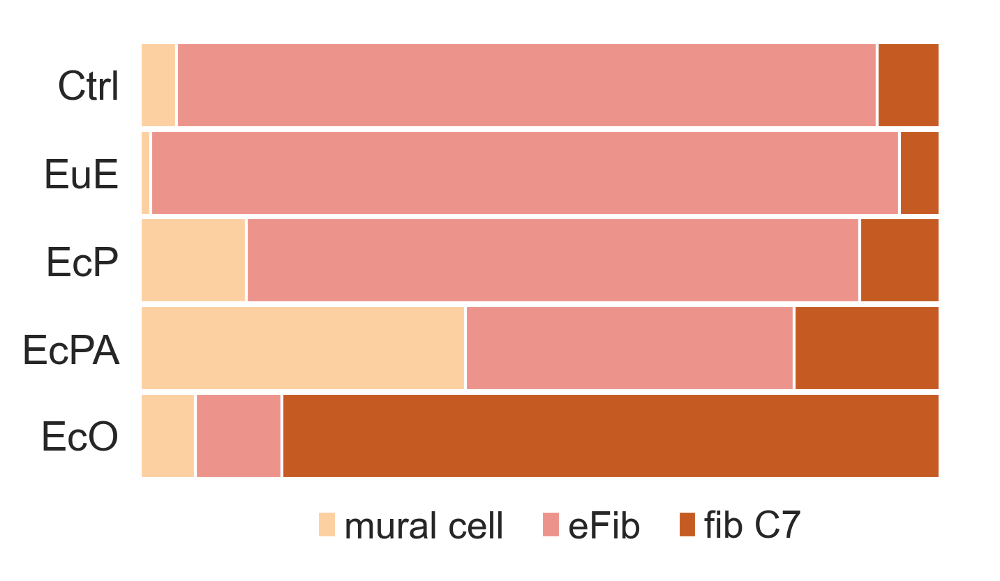

In [122]:
from plot_funcs import plot_celltype_proportions

pal =  [stro_palette[-1],stro_palette[2],stro_palette[-6]]
sns.set_style("white")

props = get_cluster_proportions(stro, cluster_key="sub_class",sample_key="sample_type_rename")
fig = plot_celltype_proportions(props,cluster_palette=pal);
save_figure(fig,pdir="v4/Fig_S5", name="S5a. props_stro-subclass")

---
**Extended Data 3b** sample type distribution

In [123]:
mural_cell = ["VSMC", "Prv-MYH11", "Prv-CCL19", "Prv-STEAP4"]
adata = stro[stro.obs.subtypes.isin(mural_cell)].copy()

/home/tany/.conda/envs/endometriosis/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


In [124]:
sc.tl.embedding_density(adata, basis='umap', groupby='sample_type_rename')
cmap = cmo.tools.crop_by_percent(cmo.cm.thermal_r, 50, which='max', N=None)

computing density on 'umap'
--> added
    'umap_density_sample_type_rename', densities (adata.obs)
    'umap_density_sample_type_rename_params', parameter (adata.uns)


/home/tany/.conda/envs/endometriosis/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:365: MatplotlibDeprecationWarning: Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.
  cax = scatter(
EC19001-SC2100428/code/plot_funcs.py:37: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "bbox" which is no longer supported as of 3.3 and will become an error two minor releases later
  fig.savefig(out, dpi=dpi , bbox="tight")


Saved to S5b. UMAP-mural_density-yellow.pdf


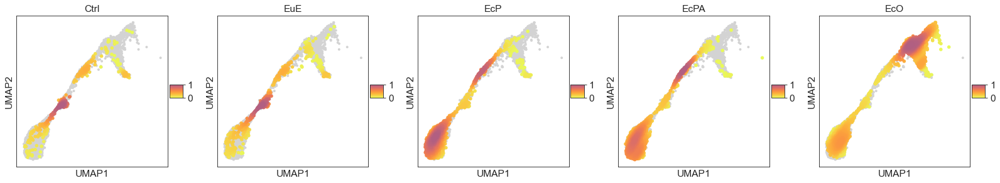

In [125]:
fig = sc.pl.embedding_density(adata,basis="umap",key="umap_density_sample_type_rename",ncols=5,
                        color_map=cmap,
                        show=False,
                        bg_dotsize= 50, 
                        fg_dotsize= 100,return_fig=True)
fix_aspect_scatter_with_legend(fig)
save_figure(fig,pdir="v4/Fig_S5", name="S5b. UMAP-mural_density-yellow")

---
**Extended Data 3c** pericytes markers

In [126]:
#genes were selected from markers from comparison to all stromal cells and specific differences within pericytes population
reorder_genes = ['MCAM','MYH11','BCAM','TINAGL1','PLN','RERGL','LBH','CD9','CRIP1','NTRK2',
                 'RGS5','HIGD1B','GJC1','NDUFA4L2','GUCY1A2','CTSC','MARCKS','THY1','COL5A2','CYTOR','DLC1',
                 'GGT5','ABCC9','APOE','C1R','COL6A3','STEAP4','C2orf40','LGI4',
                 'DCN','RBP1','RAMP1','FBLN1','BASP1','MDK','SERPINF1','CTSB','IGFBP2','S100A13','C1S','LY6E','EMILIN1',
                 'MARCKSL1','LRP1','ZYX','TCEAL3','MXRA8']

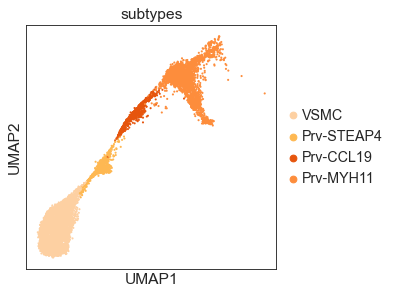

In [127]:
adata.obs["subtypes"].cat.reorder_categories([
    "VSMC", "Prv-STEAP4", "Prv-CCL19","Prv-MYH11"
],
    inplace=True)

mural_pal = [stro_palette[-1],stro_palette[-4],stro_palette[-3],stro_palette[-2]]

sc.pl.umap(adata, color=["subtypes"], palette=mural_pal)

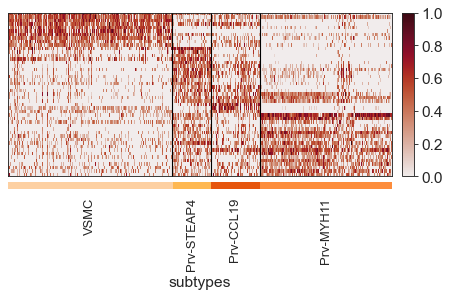

In [128]:
amp = cmo.tools.crop_by_percent(cmo.cm.thermal_r,50, which='max', N=None)
fig = sc.pl.heatmap(adata, 
                    var_names=reorder_genes, 
                    groupby="subtypes",
                    standard_scale="var",
                    swap_axes=True,figsize=(6.5,3),show_gene_labels=False,
                    cmap=cmo.cm.amp, 
                    save="S5c. mural-markers"
                    )

---
**Extended Data 3d** pericytes-ccl19 sample type specific expression

In [129]:
cp = adata[adata.obs.subtypes == "Prv-CCL19"]
cp

/home/tany/.conda/envs/endometriosis/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


View of AnnData object with n_obs × n_vars = 1070 × 24401
    obs: 'sequencing_saturation', 'stage', 'n_genes_by_counts', 'total_counts', 'pct_counts_mitochondrial', 'pct_counts_hemoglobin', 'sampleid', 'celltype', 'celltype_main', 'subtypes', 'sample_type_rename', 'PID', 'G2M_score', 'phase', 'sub_class', 'umap_density_sample_type_rename'
    var: 'gene_ids', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'neighbors', 'output_dir', 'pca', 'raw_dtype', 'sampleid', 'subtypes_colors', 'umap', 'sample_type_rename_colors', 'PID_colors', 'stage_colors', 'umap_density_sample_type_rename_params'
    obsm: 'X_pca', 'X_pca_uncorrected', 'X_umap'
    varm: 'PCs'
    layers: 'normed', 'raw'
    obsp: 'connectivities', 'distances'

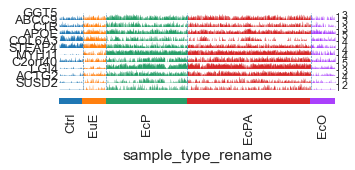

In [130]:
genes = ['GGT5','ABCC9','C1R','APOE','COL6A3','STEAP4',"MYH11",'C2orf40','LGI4',"ACTG2","SUSD2"]
#cmap = cmo.tools.crop_by_percent(cmo.cm.thermal_r, 50, which='max', N=None)


sc.pl.tracksplot(cp, genes, groupby="sample_type_rename",standard_scale="var", figsize=(5,1.5), 
                 save="S5d. ccl19-pericytes-markers"
                )

---
**Extended Data 3e.** Prv-CCL19 proportion boxplot 

/home/tany/.conda/envs/endometriosis/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)
EC19001-SC2100428/code/plot_funcs.py:37: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "bbox" which is no longer supported as of 3.3 and will become an error two minor releases later
  fig.savefig(out, dpi=dpi , bbox="tight")


Saved to S5e. props_byPID_Prv-CCL19.pdf


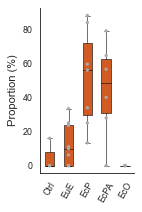

In [131]:
proportion_per_patient_barplot(stro[stro.obs.subtypes.str.contains("CCL19")], 
                               gene="CCL19",groupby="sample_type_rename",
                               bar_color=stro_palette[-3],
                               filename = "S5e. props_byPID_Prv-CCL19",figdir="v4/Fig_S5"
                              )

---
**Extended Data 4a** prop per PID of *DLL4* expressing cells in EC-tip

/home/tany/.conda/envs/endometriosis/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


Saved to S6a. props_byPID_EC-tip-DLL4.pdf


EC19001-SC2100428/code/plot_funcs.py:37: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "bbox" which is no longer supported as of 3.3 and will become an error two minor releases later
  fig.savefig(out, dpi=dpi , bbox="tight")


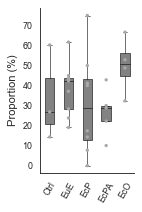

In [135]:
proportion_per_patient_barplot(endo[endo.obs.subtypes.str.contains("tip")], 
                               gene="DLL4",groupby="sample_type_rename",
                               bar_color=endo_palette[2],
                               filename = "S6a. props_byPID_EC-tip-DLL4",figdir="v4/Fig_S6"
                              )

---
**Extended Data 4b** endothelial cell sample type distribution

computing density on 'umap'
--> added
    'umap_density_sample_type_rename', densities (adata.obs)
    'umap_density_sample_type_rename_params', parameter (adata.uns)
/home/tany/.conda/envs/endometriosis/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:365: MatplotlibDeprecationWarning: Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.
  cax = scatter(
EC19001-SC2100428/code/plot_funcs.py:37: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "bbox" which is no longer supported as of 3.3 and will become an error two minor releases later
  fig.savefig(out, dpi=dpi , bbox="tight")


Saved to UMAP-endo_density-gray.pdf


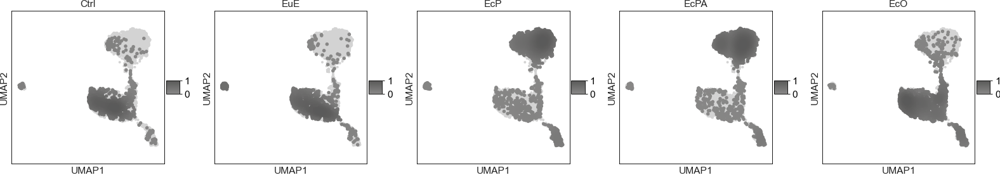

In [76]:
sc.tl.embedding_density(endo, basis='umap', groupby='sample_type_rename')
cmap = cmo.tools.crop_by_percent(cmo.cm.gray_r,80)

fig = sc.pl.embedding_density(endo,basis="umap",key="umap_density_sample_type_rename",ncols=5,
                        color_map=cmap,
                        show=False,
                        bg_dotsize= 50, 
                        fg_dotsize= 100,return_fig=True)
fix_aspect_scatter_with_legend(fig)
save_figure(fig,pdir="v4/Fig_S6", name="UMAP-endo_density-gray")

---
**Extended Data 4c** endothelial cell proportion

EC19001-SC2100428/code/plot_funcs.py:37: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "bbox" which is no longer supported as of 3.3 and will become an error two minor releases later
  fig.savefig(out, dpi=dpi , bbox="tight")


Saved to S6b. props_endothelial.pdf


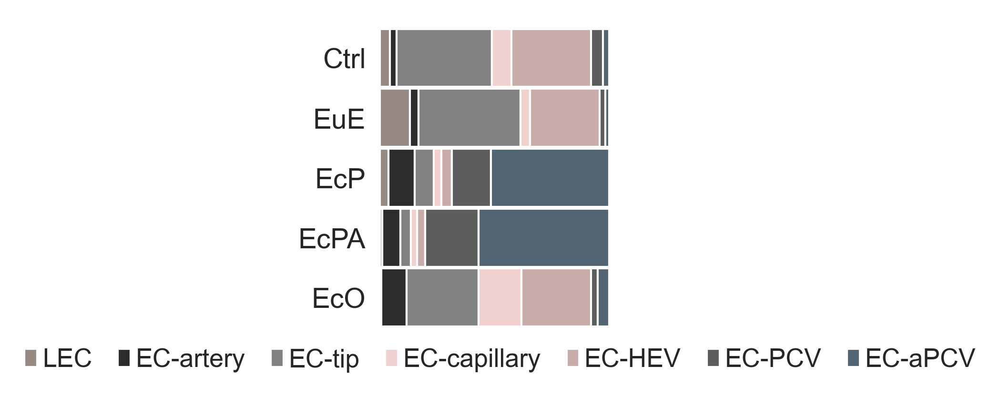

In [146]:
from plot_funcs import plot_celltype_proportions
sns.set_style("white")
props = get_cluster_proportions(endo, cluster_key="subtypes",sample_key="sample_type_rename")
fig = plot_celltype_proportions(props,cluster_palette=endo_palette[:-1]);

#fig = plot_celltype_proportions(props,cluster_palette=sns.color_palette(["royalblue","tomato","mediumseagreen"]));
save_figure(fig,pdir="v4/Fig_S6", name="S6b. props_endothelial")

---
**Extended Data 4d** Props per PID EC-aPCV, AQP1

/home/tany/.conda/envs/endometriosis/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


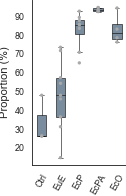

In [113]:
proportion_per_patient_barplot(endo, gene="AQP1",groupby="sample_type_rename",bar_color=endo_palette[-1],
                              #filename = "S6c. props_AQP1-EC-aPCV",figdir="v4/Fig_S6"
                              )

---
**Extended Data 4e** AQP1 exp in EC-aPCV

/home/tany/.conda/envs/endometriosis/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)
/home/tany/.conda/envs/endometriosis/lib/python3.8/site-packages/seaborn/categorical.py:1296: UserWarning: 14.3% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/home/tany/.conda/envs/endometriosis/lib/python3.8/site-packages/seaborn/categorical.py:1296: UserWarning: 73.1% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/home/tany/.conda/envs/endometriosis/lib/python3.8/site-packages/seaborn/categorical.py:1296: UserWarning: 79.1% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(ms

Saved to S6d. props_exp_AQP1-aPCV.pdf


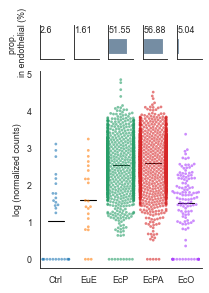

In [143]:
props_exp_plot(endo, celltype="endothelial", subtypes="EC-aPCV", gene="AQP1", bar_color=endo_palette[-1],
              filename = "S6d. props_exp_AQP1-aPCV",figdir="v4/Fig_S6"
              )

---
**Fig 3a.** Myeloid UMAP

-- use previously generated UMAP for Fig 1d

---
**Fig 3b** Macrophage subpopulation marker: TRM, infiltrated, activated

In [147]:
genes = ["FOLR2","LYVE1","MRC1","CX3CR1",
         "ICAM2","CLEC5A", "CCR2", "VEGFA",
         "FN1","SPARC","APOE","SPP1",]

In [148]:
adata = mye[mye.obs.subtypes.str.contains("Phi")]
adata.obs.subtypes.unique()

/home/tany/.conda/envs/endometriosis/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


['M$\Phi$1-LYVE1', 'M$\Phi$4-infiltrated', 'M$\Phi$3-APOE', 'M$\Phi$5-activated', 'M$\Phi$2-peritoneal']
Categories (5, object): ['M$\Phi$1-LYVE1', 'M$\Phi$4-infiltrated', 'M$\Phi$3-APOE', 'M$\Phi$5-activated', 'M$\Phi$2-peritoneal']

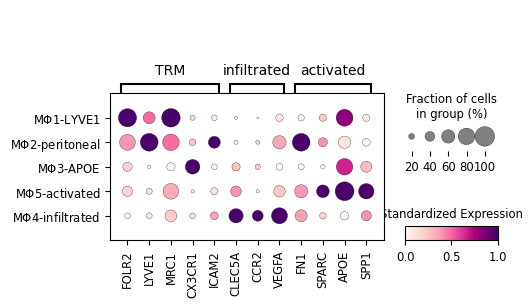

EC19001-SC2100428/code/plot_funcs.py:37: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "bbox" which is no longer supported as of 3.3 and will become an error two minor releases later
  fig.savefig(out, dpi=dpi , bbox="tight")


Saved to 3b. dotplot-mac_phenotypes.pdf


In [150]:
matplotlib.rcdefaults()
fig, ax = plt.subplots(1,1, figsize=(5,3))
sc.pl.dotplot(adata,
              var_names= genes, 
              groupby="subtypes", 
              var_group_labels = ["TRM", "infiltrated", "activated"],
              var_group_positions= [(0,4),(5,7),(8,11)],
              var_group_rotation= 0,
              standard_scale="var", 
              cmap="RdPu", ax=ax,
              colorbar_title="Standardized Expression")

save_figure(fig,pdir="v4/Fig_3", name="3b. dotplot-mac_phenotypes")

---
**Fig 3c** Macrophage density

computing density on 'umap'
--> added
    'umap_density_sample_type_rename', densities (adata.obs)
    'umap_density_sample_type_rename_params', parameter (adata.uns)
EC19001-SC2100428/code/plot_funcs.py:37: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "bbox" which is no longer supported as of 3.3 and will become an error two minor releases later
  fig.savefig(out, dpi=dpi , bbox="tight")


Saved to 3c. UMAP-Mac_density.pdf


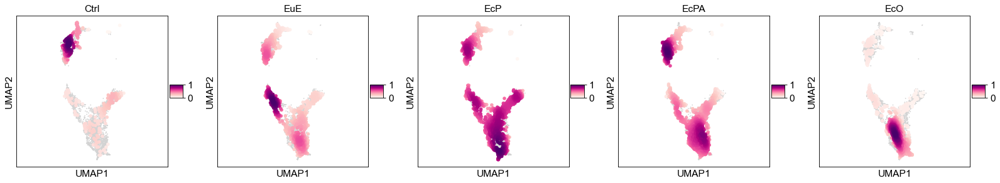

In [156]:
sc.set_figure_params(scanpy=True, vector_friendly=True, facecolor=None)
sc.tl.embedding_density(adata, basis='umap', groupby='sample_type_rename')

cmap = matplotlib.cm.get_cmap("RdPu")
fig = sc.pl.embedding_density(adata,basis="umap",key="umap_density_sample_type_rename",ncols=5,
                        color_map=cmap,
                        show=False,
                        bg_dotsize= 10, 
                        fg_dotsize= 100,return_fig=True)
fix_aspect_scatter_with_legend(fig)
save_figure(fig,pdir="v4/Fig_3", name="3c. UMAP-Mac_density")

---
**Fig3d** Velocyto  UMAp for mo/mac

Bill generated the figure and saved it in `/figures/manuscript-bill`

---
**Fig3e** : LYVE1+ proportion in all Mac

/home/tany/.conda/envs/endometriosis/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


Saved to 3e. props_LYVE1 in mac.pdf


EC19001-SC2100428/code/plot_funcs.py:37: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "bbox" which is no longer supported as of 3.3 and will become an error two minor releases later
  fig.savefig(out, dpi=dpi , bbox="tight")


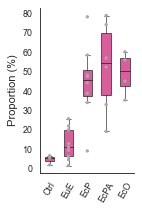

In [161]:
proportion_per_patient_barplot(mye[mye.obs.subtypes.str.contains("Phi")],gene="LYVE1",groupby="sample_type_rename",
                               bar_color=mye_palette[5],
                               filename = "3e. props_LYVE1 in mac",figdir="v4/Fig_3"
                              )

---
**Fig 3f**: dotplot for LYVE1+ mac

/home/tany/.conda/envs/endometriosis/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


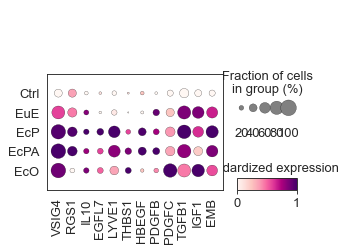

Saved to 3f. dotplot-m1_deg.pdf


EC19001-SC2100428/code/plot_funcs.py:37: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "bbox" which is no longer supported as of 3.3 and will become an error two minor releases later
  fig.savefig(out, dpi=dpi , bbox="tight")


In [165]:
cmap = matplotlib.cm.get_cmap("RdPu")
                              
fig, ax = plt.subplots(1,1, figsize=(4,3))
sc.pl.dotplot(mye[mye.obs.subtypes.str.contains("LYVE1")],
                 groupby="sample_type_rename",
                 var_names=["VSIG4","RGS1","IL10","EGFL7","LYVE1","THBS1","HBEGF","PDGFB","PDGFC","TGFB1","IGF1","EMB"],
                standard_scale="var",colorbar_title="Standardized expression",
              color_map=cmap,ax=ax)
save_figure(fig,pdir="v4/Fig_3", name="3f. dotplot-m1_deg")

---
**Fig 3h**: IMC showing LYVE1+ macrophage localisation near blood vessels

---
**Fig 3h**: Macrophage infiltrated profile

/home/tany/.conda/envs/endometriosis/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


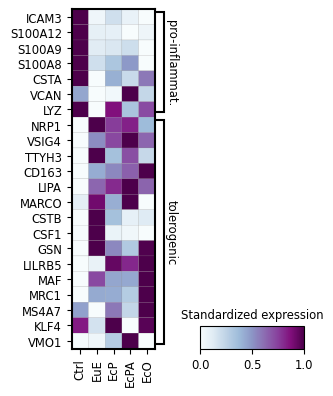

In [168]:
pro_state = ["ICAM3","S100A12","S100A9","S100A8","CSTA", "VCAN","LYZ"]
tol_state = ["NRP1","VSIG4", "TTYH3", "CD163",
             "LIPA","MARCO","CSTB", "CSF1","GSN","LILRB5","MAF","MRC1","MS4A7","KLF4", "VMO1"]
mr = ["LOX","PLOD2","FN1","COL1A1","COL1A2","COL3A1","TAGLN2"]

gene_list = pro_state+tol_state

matplotlib.rcdefaults()
sc.pl.matrixplot(mye[mye.obs.subtypes.str.contains("infil")], 
                     var_names= gene_list, groupby="sample_type_rename", 
                     var_group_labels=["pro-inflammatory","tolerogenic"],
                     var_group_positions=[(0,6),(7,21)],
                     figsize=(3,4),
                     colorbar_title = "Standardized expression",
                     swap_axes = True,
                     standard_scale='var',
                     cmap="BuPu", 
                     save=f"-inflammation-M4"
                    )

---
**Extended Data 5a**: markers for each myleoid subtypes

In [17]:
#compared to all myeloid
markers = pd.read_csv(f"{main_dir}/analysis/{sample_id}/markers/Endo-Tissue-EC19001-SC2100428-3-mye-subtypes-markers.csv",
                     sep = ",")

top5 = markers[(markers["specific_20%"] == True)].groupby("cluster").head(5)
top5.drop_duplicates(subset = "gene", inplace=True, keep="first")
reorder_genes = top5.gene.to_list()

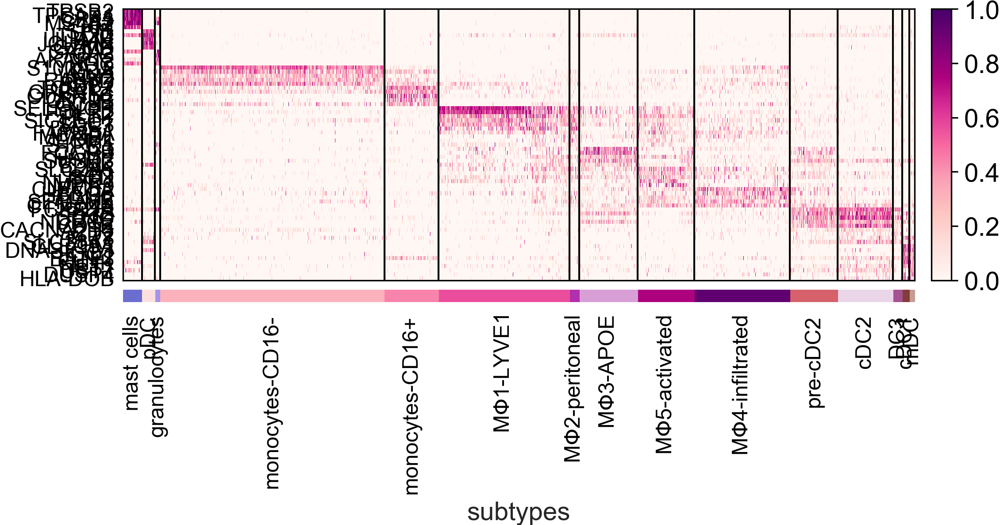

In [18]:
sc.pl.heatmap(mye, 
              var_names=reorder_genes, 
              groupby="subtypes",
              standard_scale="var",
              swap_axes=True,
              figsize=(8,3),
              show_gene_labels=True,
              cmap="RdPu", 
              save="Mye-markers",
             )

---
**Extended Data 5b** Myeloid dendrogram

    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_subtypes']`


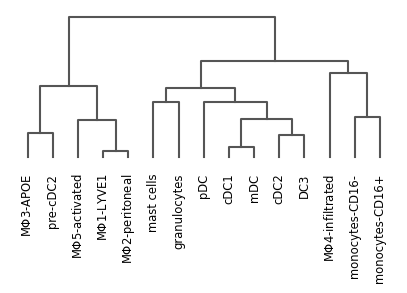

Saved to S7b. dendrogram-myeloid.pdf


EC19001-SC2100428/code/plot_funcs.py:37: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "bbox" which is no longer supported as of 3.3 and will become an error two minor releases later
  fig.savefig(out, dpi=dpi , bbox="tight")


In [186]:
sc.tl.dendrogram(mye, groupby="subtypes")

fig,ax =plt.subplots(figsize=(5,2))
sc.pl.dendrogram(mye, groupby="subtypes",ax=ax)
save_figure(fig,pdir="v4/Fig_S7", name="S7b. dendrogram-myeloid")

---
**Extended Data 5c**: barplot all myeloid

EC19001-SC2100428/code/plot_funcs.py:551: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations. 
  fig.tight_layout()
EC19001-SC2100428/code/plot_funcs.py:37: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "bbox" which is no longer supported as of 3.3 and will become an error two minor releases later
  fig.savefig(out, dpi=dpi , bbox="tight")


Saved to S7c. props_mye-subtypes.pdf


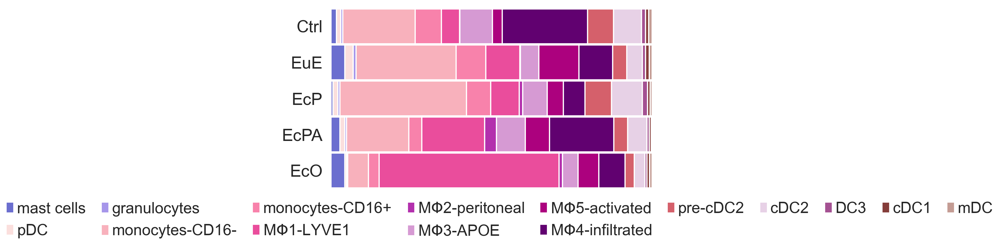

In [19]:
from plot_funcs import plot_celltype_proportions

sns.set_style("white")
props = get_cluster_proportions(mye, cluster_key="subtypes",sample_key="sample_type_rename")
fig = plot_celltype_proportions(props,cluster_palette=mye_palette);
save_figure(fig,pdir="v4/Fig_S7", name="S7c. props_mye-subtypes")

---

**Fig 4a-b.** DC marker genes & proportion barplot for each cluster

/home/tany/.conda/envs/endometriosis/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)
EC19001-SC2100428/code/plot_funcs.py:37: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "bbox" which is no longer supported as of 3.3 and will become an error two minor releases later
  fig.savefig(out, dpi=dpi , bbox="tight")


Saved to 4a. DC_markers.pdf


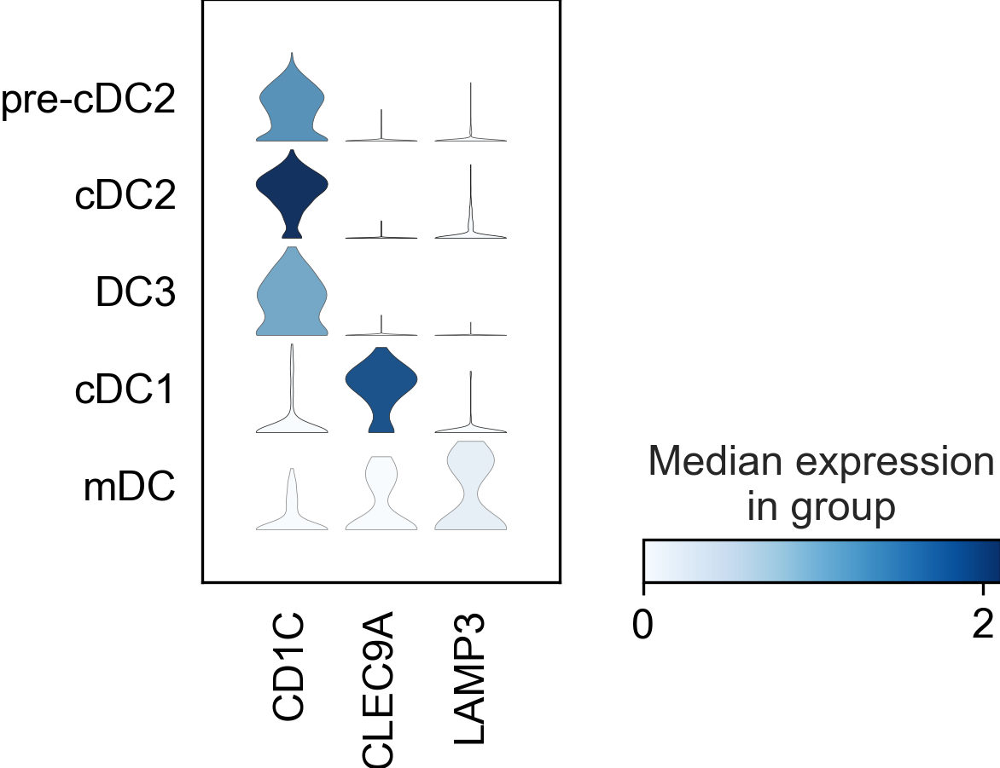

In [14]:
#Part 1
adata = mye[(mye.obs.subtypes.str.contains("DC"))&(mye.obs.subtypes != "pDC")]
gene_to_plot = ["CD1C","CLEC9A","LAMP3"]

f, ax = plt.subplots(1,1,figsize=(4,3))
sc.pl.stacked_violin(adata, var_names=gene_to_plot, groupby="subtypes", return_fig=False, 
                                 show=False,fontsize=8,figsize=(3,2), ax=ax)
save_figure(f,pdir="v4/Fig_4", name="4a. DC_markers")

In [15]:
cluster_props = get_cluster_proportions(adata,cluster_key="subtypes",sample_key="sample_type_rename")

In [16]:
cluster_props

subtypes,pre-cDC2,cDC2,DC3,cDC1,mDC
sample_type_rename,,,,,
Ctrl,39.910314,43.497758,6.278027,4.932735,5.381166
EuE,36.070381,39.002933,8.211144,9.677419,7.038123
EcP,39.566116,45.661157,7.851240,3.925620,2.995868
EcPA,36.330935,50.000000,6.115108,5.035971,2.517986
EcO,34.426230,39.344262,6.557377,9.836066,9.836066


<ipython-input-43-4748d7c9b1f4>:20: UserWarning: FixedFormatter should only be used together with FixedLocator
  axs[k].set_xticklabels([""],fontsize=8)
<ipython-input-43-4748d7c9b1f4>:22: UserWarning: FixedFormatter should only be used together with FixedLocator
  axs[-1].set_yticklabels(["abc","CD1C","CLEC9A","CCR7"])
EC19001-SC2100428/code/plot_funcs.py:37: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "bbox" which is no longer supported as of 3.3 and will become an error two minor releases later
  fig.savefig(out, dpi=dpi , bbox="tight")


Saved to 4b.DC_props.pdf


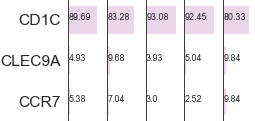

In [43]:
adata.obs["plot_cat"] = adata.obs.subtypes.map({
    "pre-cDC2":"CD1C+",
    "cDC2":"CD1C+",
    "DC3":"CD1C+",
    "cDC1":"cDC1",
    "mDC":"mDC"
})
df = get_cluster_proportions(adata,cluster_key="plot_cat",sample_key="sample_type_rename")

sns.set_style("white")
fig, axs = plt.subplots(1, df.shape[0], sharey=True, figsize=(3,2))
for k, (_, row) in enumerate(df.iterrows()):
    #xlim=(np.max(row.values)*1.2)
    axs[k].barh(np.arange(len(row)), row.values, height=0.7,color=mye_palette[-4])
    axs[k].set_xlim(0,100)
    #axs[k].set_ylim(0.5,1.8)
    axs[k].text(1.2, 0, (np.round(row.values,2))[0],fontsize=8)
    axs[k].text(1.2, 1, (np.round(row.values,2))[1],fontsize=8)
    axs[k].text(1.2, 2, (np.round(row.values,2))[2],fontsize=8)
    axs[k].set_xticklabels([""],fontsize=8)
sns.despine(fig)
axs[-1].set_yticklabels(["abc","CD1C","CLEC9A","CCR7"])
axs[-1].invert_yaxis()
save_figure(fig,pdir="v4/Fig_4", name="4b.DC_props")

---
**Fig 4c** DC density plot

... storing 'plot_cat' as categorical
computing density on 'umap'
--> added
    'umap_density_sample_type_rename', densities (adata.obs)
    'umap_density_sample_type_rename_params', parameter (adata.uns)
/home/tany/.conda/envs/endometriosis/lib/python3.8/site-packages/scanpy/plotting/_tools/__init__.py:1182: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("RdPu"))
  color_map.set_over('black')
/home/tany/.conda/envs/endometriosis/lib/python3.8/site-packages/scanpy/plotting/_tools/__init__.py:1183: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.g

Saved to 4c. UMAP-DC_density.pdf


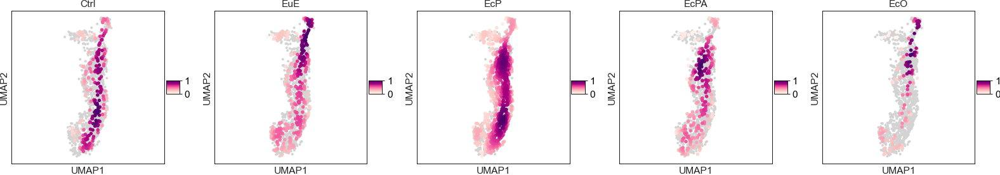

In [18]:
sc.set_figure_params(scanpy=True, vector_friendly=True, facecolor=None)
cmap = matplotlib.cm.get_cmap("RdPu")

sc.tl.embedding_density(adata, basis='umap', groupby='sample_type_rename')
fig = sc.pl.embedding_density(adata,basis="umap",key="umap_density_sample_type_rename",ncols=5,
                        color_map=cmap,
                        show=False,
                        bg_dotsize= 50, 
                        fg_dotsize= 100,return_fig=True)
fix_aspect_scatter_with_legend(fig)
save_figure(fig,pdir="v4/Fig_4", name="4c. UMAP-DC_density")

---
**Fig 4d**: CD207, CD1A, TOP2A in UMAP

In [20]:
from plot_funcs import scatter_2by3

EC19001-SC2100428/code/plot_funcs.py:37: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "bbox" which is no longer supported as of 3.3 and will become an error two minor releases later
  fig.savefig(out, dpi=dpi , bbox="tight")


Saved to 4d. UMAP-DC_immatureDC.pdf


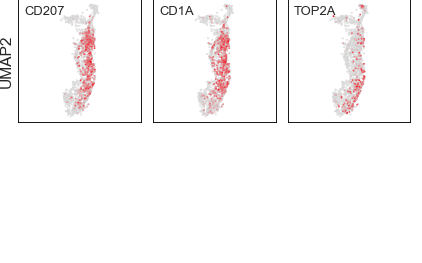

In [21]:
scatter_2by3(adata, ["CD207","CD1A","TOP2A"],markersize=10,
             filename="4d. UMAP-DC_immatureDC",
             figdir="v4/Fig_4", ext="pdf"
            )

---
**Fig. 4e** expression of CD207 in each patient per sample type

/home/tany/.conda/envs/endometriosis/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


Saved to 4e. props_byPID_CD207-in-cDC2.pdf


EC19001-SC2100428/code/plot_funcs.py:37: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "bbox" which is no longer supported as of 3.3 and will become an error two minor releases later
  fig.savefig(out, dpi=dpi , bbox="tight")


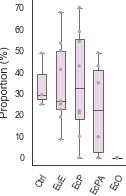

In [22]:
proportion_per_patient_barplot(mye[mye.obs.subtypes.str.contains("cDC2")], 
                               gene="CD207",groupby="sample_type_rename",
                               bar_color=mye_palette[-4],
                               filename = "4e. props_byPID_CD207-in-cDC2",figdir="v4/Fig_4"
                              )

CD207 is not expressed in immature cDC2 population of ovarian dendritic cells 

---
**Fig 4f. tracksplot for cDC2 population**

In [25]:
dc = mye[(mye.obs.sample_type_rename != "EcO") & (mye.obs.subtypes =="cDC2")]
genes = ["CD1C","CD207","CD1A","IL18","GNLY","MSR1","PECAM1","VSIG4","MRC1"]

sc.pl.tracksplot(dc, var_names = genes, 
                 groupby="sample_type_rename", 
                 show = False, fontsize=8,ax=ax,
                 figsize=(8,3),
                 save="-cDC2_DEG"
                )

Trying to set attribute `.uns` of view, copying.


{'track_axes': [<AxesSubplot:ylabel='CD1C'>,
  <AxesSubplot:ylabel='CD207'>,
  <AxesSubplot:ylabel='CD1A'>,
  <AxesSubplot:ylabel='IL18'>,
  <AxesSubplot:ylabel='GNLY'>,
  <AxesSubplot:ylabel='MSR1'>,
  <AxesSubplot:ylabel='PECAM1'>,
  <AxesSubplot:ylabel='VSIG4'>,
  <AxesSubplot:ylabel='MRC1'>],
 'groupby_ax': <AxesSubplot:xlabel='sample_type_rename'>}

---
**Fig 4g**: cDC2 cell states scatterplot

In [22]:
iDC_state = sc.read(f"{main_dir}/data/h5ad/{sample_id}/Myeloid/{sample_id}-cDC2-state-20220120.h5ad")

In [70]:
iDC_state

AnnData object with n_obs × n_vars = 581 × 15532
    obs: 'sequencing_saturation', 'Patient_id', 'stage', 'scrublet_predicted_doublet', 'scrublet_score', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mitochondrial', 'log1p_total_counts_mitochondrial', 'pct_counts_mitochondrial', 'total_counts_hemoglobin', 'log1p_total_counts_hemoglobin', 'pct_counts_hemoglobin', 'library', '10x_chemistry', 'sample_name', 'sampleid', 'sample_type', 'leiden', 'leiden_R1', 'leiden_R2', 'leiden_R3', 'leiden_R4', 'leiden_R5', 'leiden_R6', 'leiden_R7', 'cluster', 'cluster_R1', 'celltype', 'celltype_main', 'mye_leiden', 'mye_leiden_R1', 'mye_leiden_R2', 'mye_leiden_R3', 'mye_leiden_R4', 'visible_doublet', 'mye_cluster', 'old_subtypes', 'mye_cluster_R1', 'subtypes', 'immunogenic', 'immunosupressive', 'state', 'umap_density_state'
    va

computing density on 'umap'
--> added
    'umap_density_state', densities (adata.obs)
    'umap_density_state_params', parameter (adata.uns)
EC19001-SC2100428/code/plot_funcs.py:37: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "bbox" which is no longer supported as of 3.3 and will become an error two minor releases later
  fig.savefig(out, dpi=dpi , bbox="tight")


Saved to 4c. UMAP-cDC2-state_density.pdf


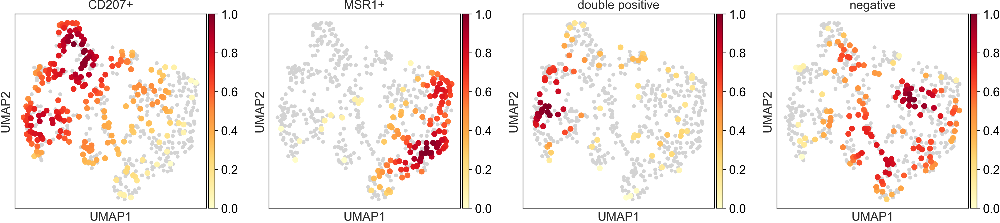

In [84]:
sc.tl.embedding_density(iDC_state,groupby="state")
fig = sc.pl.embedding_density(iDC_state,groupby="state",
                              show=False,return_fig=True)
#fix_aspect_scatter_with_legend(fig)
save_figure(fig,pdir="v4/Fig_4", name="4c. UMAP-cDC2-state_density")

In [15]:
iDC = mye[(mye.obs.sample_type_rename.isin(["EcP","EcPA"])) & (mye.obs.subtypes == "cDC2")].copy()
iDC.obs["immunogenic"] = (iDC[:, "CD207"].layers["raw"].sum(axis=1) > 0).A1.astype(bool)
iDC.obs["immunosupressive"] = (iDC[:, "MSR1"].layers["raw"].sum(axis=1) > 0).A1.astype(bool)
iDC.obs["state"] = (2*iDC.obs.immunogenic.astype(int) + iDC.obs.immunosupressive.astype(int)).map({
    0: "negative", 1: "MSR1+", 2: "CD207+", 3: "double positive"}).astype("category")

#keep for DE analysis
keep = np.logical_xor(iDC.obs.immunogenic, iDC.obs.immunosupressive)
subset = iDC[keep,:]
subset.obs["state"] = subset.obs.immunosupressive.map({
    True:"MSR1+",
    False:"CD207+"
})

state_pal = [get_xkcd[-1],get_xkcd[-2],Greys[2],get_xkcd[5]]

/home/tany/.conda/envs/endometriosis/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)
Trying to set attribute `.obs` of view, copying.


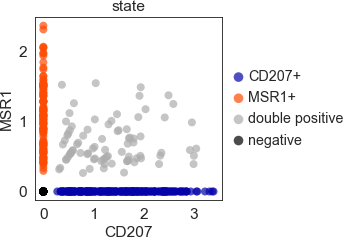

Saved to 4g. scatter_cDC2-CD1A_state.pdf


EC19001-SC2100428/code/plot_funcs.py:37: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "bbox" which is no longer supported as of 3.3 and will become an error two minor releases later
  fig.savefig(out, dpi=dpi , bbox="tight")


In [40]:
fig, ax = plt.subplots(1,1, figsize=(3,3))
sc.pl.scatter(iDC,x="CD207",y="MSR1", color="state",ax=ax,alpha = 0.7)
save_figure(fig,pdir="v4/Fig_4", name="4g. scatter_cDC2-CD1A_state")

In [85]:
iDC.obs.state.value_counts()

CD207+             237
negative           141
MSR1+              121
double positive     82
Name: state, dtype: int64

---
**Fig 4h**: cDC2 cell states DEG

... storing 'state' as categorical


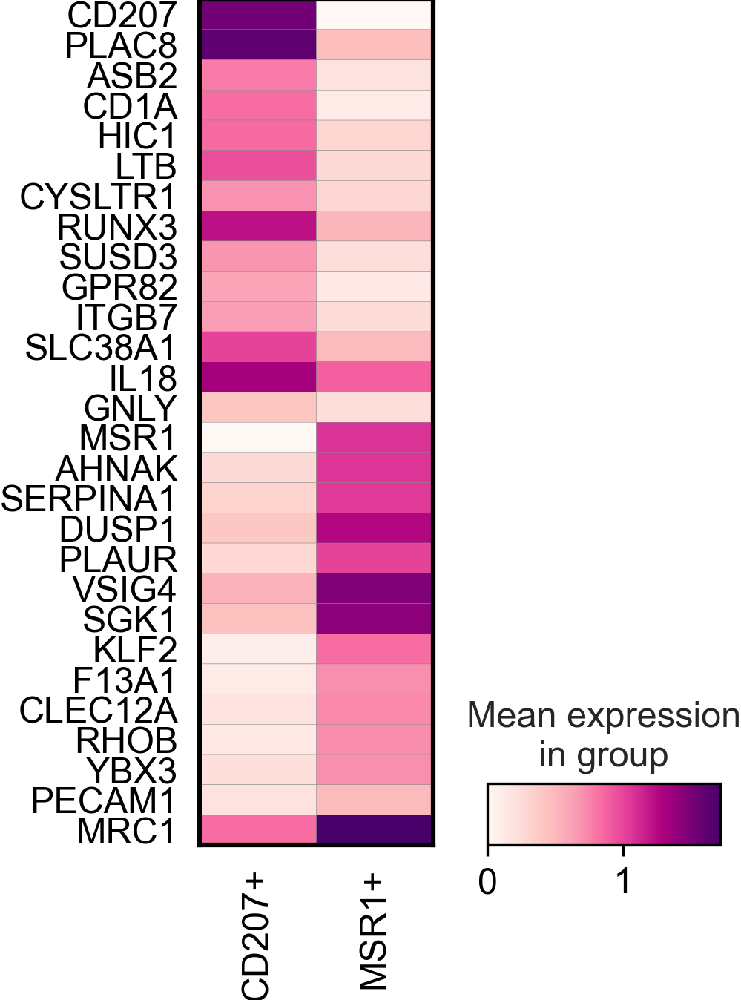

In [16]:
genes = ["CD207","PLAC8","ASB2","CD1A","HIC1","LTB","CYSLTR1","RUNX3","SUSD3","GPR82","ITGB7","SLC38A1","IL18","GNLY",
         "MSR1","AHNAK","SERPINA1","DUSP1","PLAUR","VSIG4","SGK1","KLF2","F13A1","CLEC12A","RHOB","YBX3","PECAM1","MRC1"]

sc.pl.matrixplot(subset, 
                 var_names=genes, 
                 groupby="state",
                 swap_axes=True,figsize=(3,5),
                 cmap="RdPu", 
                 #save="cDC2-states-deg"
                )

---
**Extended Data 6a** DC in mye population

<ipython-input-44-3f0fc9e161be>:43: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()
<ipython-input-44-3f0fc9e161be>:43: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()
<ipython-input-44-3f0fc9e161be>:43: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()
EC19001-SC2100428/code/plot_funcs.py:37: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "bbox" which is no longer supported as of 3.3 and will become an error two minor releases later
  fig.savefig(out, dpi=dpi , bbox="tight")


Saved to S8a. all-DC_props.pdf


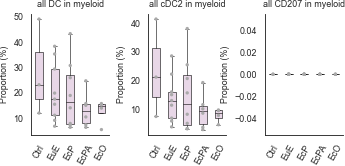

In [44]:
fig = plt.figure(figsize=(5, 2), facecolor="white")
gs = plt.GridSpec(1, 3,wspace=0.5)
ax1 = fig.add_subplot(gs[0, 0])
ax2 = fig.add_subplot(gs[0, 1])
ax3 = fig.add_subplot(gs[0, 2])
axs = [ax1,ax2,ax3]

adata = mye.copy()
targets = ["DC","cDC2","CD207"]

for target,k in zip(targets,axs):
    adata.obs[target] = (adata.obs.subtypes.str.contains(target))

    #make dataframe
    adata_tmp = adata.obs[["sample_type_rename", "PID",target]]
    df1 = adata_tmp.groupby(["sample_type_rename","PID"])[target].sum()
    df2 = adata_tmp.groupby(["sample_type_rename","PID"]).size()
    data_to_plot = (df1 / df2 * 100).reset_index()

    #plot figure
    sns.boxplot(y=0,x="sample_type_rename",data = data_to_plot,color=mye_palette[-4],
                     saturation=0.8,width=0.5,linewidth=.5,fliersize=0,ax=k)
    sns.stripplot(x='sample_type_rename', y=0, data=data_to_plot,jitter=0,
                      size=3, color='darkgray',edgecolor='black',ax=k)

    for i,box in enumerate(k.artists):
        if i == 1:
            box.set_edgecolor('black')
        else:
            box.set_edgecolor('black')

        # iterate over whiskers and median lines
        for j in range(6*i,6*(i+1)):
             k.lines[j].set_color('black')


    k.set_ylabel('Proportion (%)',fontsize=8,)
    k.set_xlabel('', fontsize=8)
    k.set_xticklabels(k.get_xticklabels(),rotation = 60,fontsize=8)
    k.tick_params(axis="y", labelsize=8)
    k.set_title(f"all {target} in myeloid", fontsize=8)
    sns.despine()
    fig.tight_layout()

save_figure(fig,pdir="v4/Fig_S8", name="S8a. all-DC_props")

---
**Extended Data 6b** DC velocyto

Bill generated the figure and saved it in `/figures/manuscript-bill`

---
**Extended Data 6c** DC cell cycle proportion

/home/tany/.conda/envs/endometriosis/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


Saved to S8c. props_cDC2-cellcycle.pdf


EC19001-SC2100428/code/plot_funcs.py:37: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "bbox" which is no longer supported as of 3.3 and will become an error two minor releases later
  fig.savefig(out, dpi=dpi , bbox="tight")


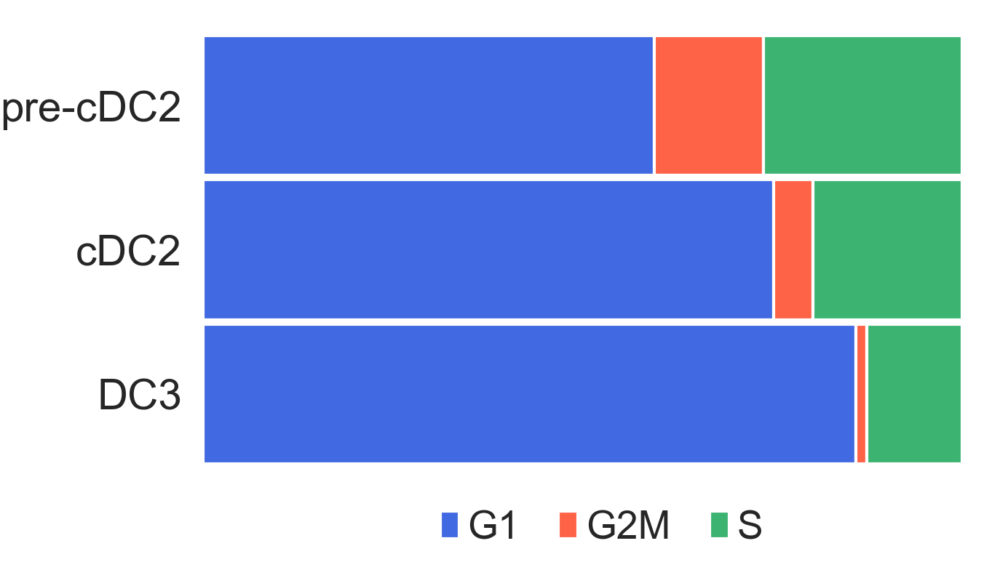

In [45]:
from plot_funcs import plot_celltype_proportions
sns.set_style("white")
props = get_cluster_proportions(adata[adata.obs.subtypes.isin(["pre-cDC2","cDC2","DC3"])], 
                                cluster_key="phase",sample_key="subtypes")
fig = plot_celltype_proportions(props,cluster_palette=sns.color_palette(["royalblue","tomato","mediumseagreen"]));
save_figure(fig,pdir="v4/Fig_S8", name="S8c. props_cDC2-cellcycle")

In [46]:
props

phase,G1,G2M,S
subtypes,,,
pre-cDC2,59.485095,14.363144,26.151762
cDC2,75.203725,5.122235,19.674040
DC3,86.013986,1.398601,12.587413


---
**Extended Data 6d** DC: FLT3, SIGLEC6, AXL

In [ ]:
from plot_funcs import scatter_2by3

/home/tany/.conda/envs/endometriosis/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)
EC19001-SC2100428/code/plot_funcs.py:37: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "bbox" which is no longer supported as of 3.3 and will become an error two minor releases later
  fig.savefig(out, dpi=dpi , bbox="tight")


Saved to S8d. UMAP-DC_progenitor-markers.pdf


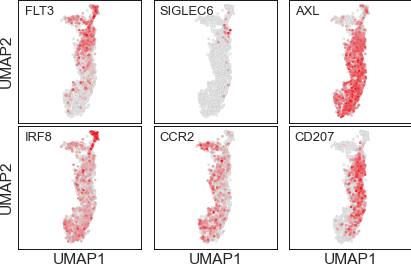

In [47]:
adata = mye[mye.obs.subtypes.str.contains("DC")&(mye.obs.subtypes != "pDC")]
sc.set_figure_params(scanpy=True, vector_friendly=True, facecolor=None)
scatter_2by3(adata, ["FLT3","SIGLEC6","AXL","IRF8","CCR2","CD207"],markersize=20,
             filename="S8d. UMAP-DC_progenitor-markers",
             figdir="v4/Fig_S8", ext="pdf"
            )

---
**Fig S4** GSEA of cDC2 between sample type

<ipython-input-51-94ea935e8230>:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sub_df["Term_short"] = sub_df["Term"].str.extract("(.*) \(GO:")
<ipython-input-51-94ea935e8230>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sub_df["nes_sign"] = nes_sign
EC19001-SC2100428/code/plot_funcs.py:37: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "bbox" which is no longer supported as of 3.3 and will become an error two minor releases later
  fig.savefig(out, dpi=dpi , bbox="tight")


Saved to GSEA-cDC2-eue.pdf


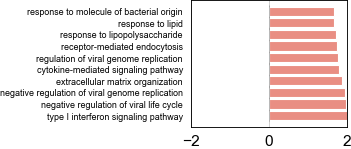

In [54]:
fig = plot_gsea_nes(subtype="cDC2", condition="eueVSctrl")
save_figure(fig,pdir="v4/Fig_S9", name="GSEA-cDC2-eue")

<ipython-input-51-94ea935e8230>:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sub_df["Term_short"] = sub_df["Term"].str.extract("(.*) \(GO:")
<ipython-input-51-94ea935e8230>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sub_df["nes_sign"] = nes_sign
EC19001-SC2100428/code/plot_funcs.py:37: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "bbox" which is no longer supported as of 3.3 and will become an error two minor releases later
  fig.savefig(out, dpi=dpi , bbox="tight")


Saved to GSEA-cDC2-ecpa.pdf


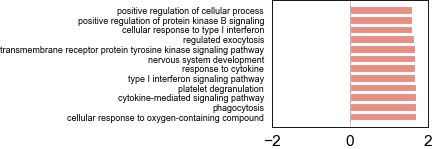

In [55]:
fig = plot_gsea_nes(subtype="cDC2", condition="ecpaVSctrl", n_path=12)
save_figure(fig,pdir="v4/Fig_S9", name="GSEA-cDC2-ecpa")

---
**Fig 5a** Lympocytes UMAP

-- use previously generated UMAP for Fig 1d

---
**Fig 5b** dot plot M1/M5 - Treg

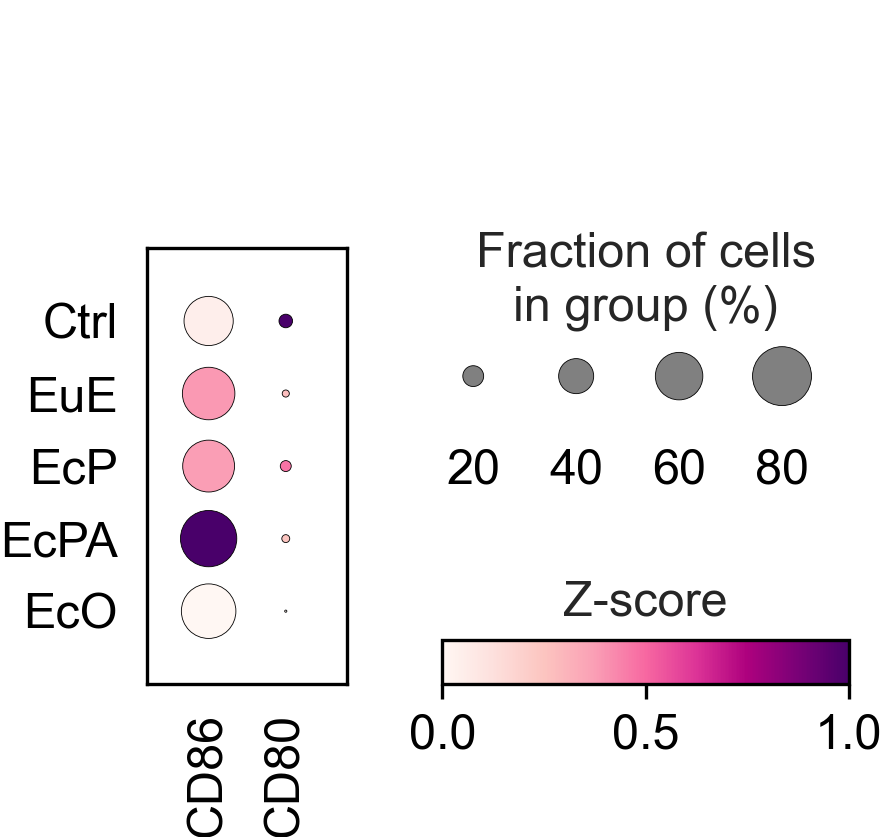

In [38]:
fig, ax = plt.subplots(1,1, figsize=(3,3))
sc.pl.dotplot(mye[mye.obs.subtypes.isin(["M$\Phi$1-LYVE1"])], 
              var_names=["CD86"], groupby="sample_type_rename", standard_scale="var", 
              colorbar_title="Z-score",
              cmap="RdPu",ax=ax)
#save_figure(fig,pdir="v4/Fig_5", name="5b. dotplot-m1-CD86")

/home/tany/.conda/envs/endometriosis/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


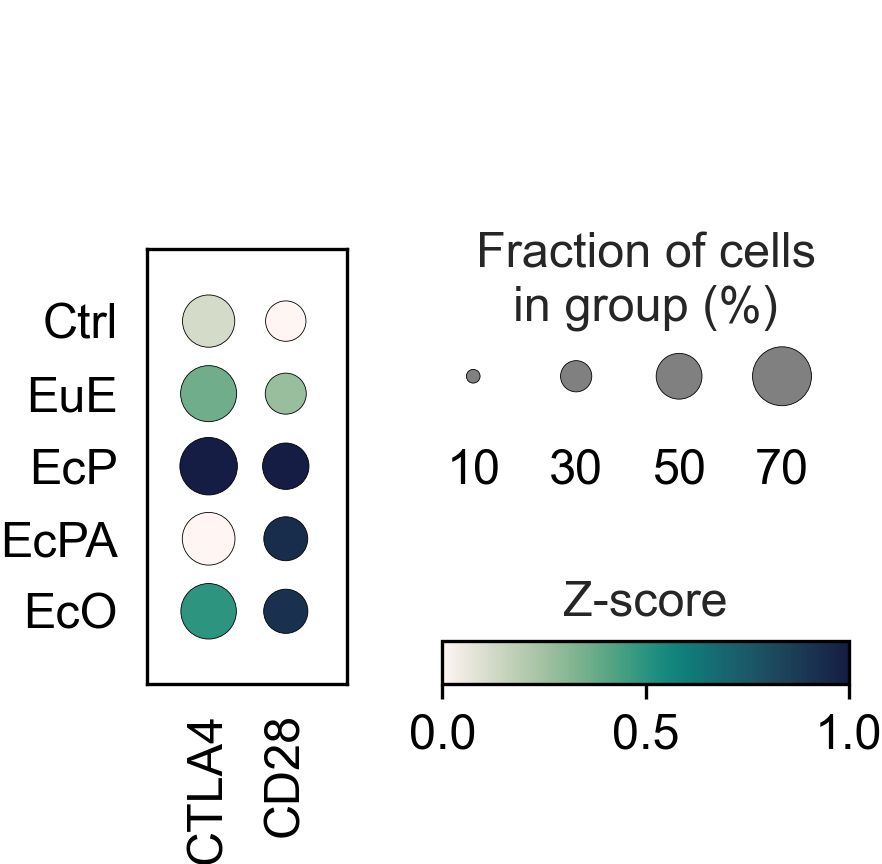

In [39]:
import cmocean as cmo
cmap = cmo.cm.tempo

fig, ax = plt.subplots(1,1, figsize=(3,3))
sc.pl.dotplot(lym[lym.obs.subtypes.str.contains("Reg")], 
              var_names=["CTLA4"], groupby="sample_type_rename", standard_scale="var", 
              colorbar_title="Z-score",
              cmap=cmap,ax=ax)
#save_figure(fig,pdir="v4/Fig_5", name="5b.dotplot-Treg-CTLA4")

---
**Fig 5c**: T reg

In [15]:
genes = ["TIGIT","PRDM1","CD96","HAVCR2","LAG3","ENTPD1","ICOS","TNFRSF4","CTLA4"]

/home/tany/.conda/envs/endometriosis/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


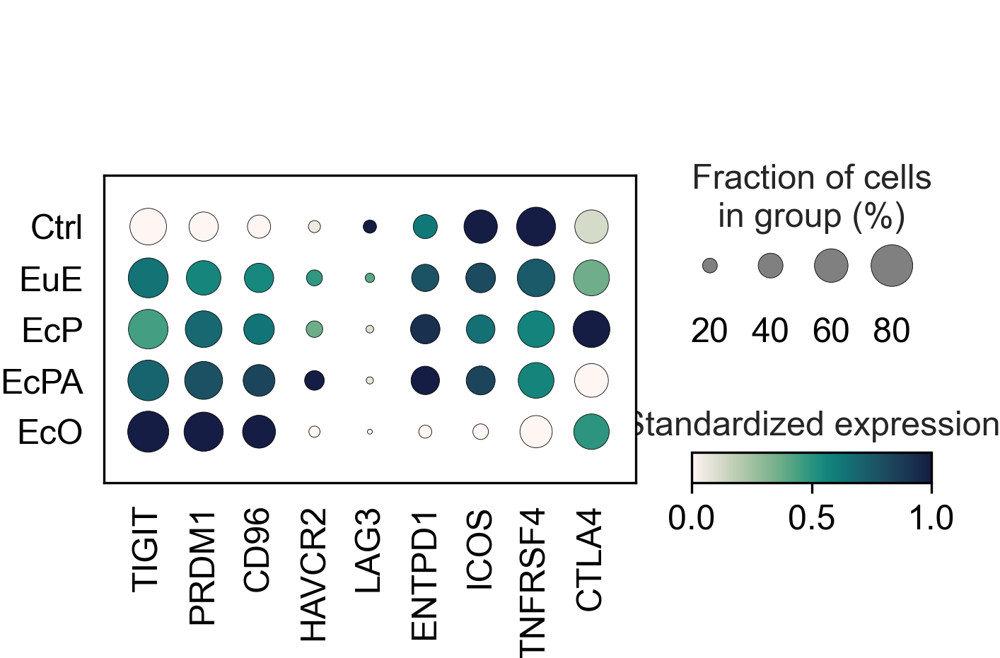

Saved to dotplot-Treg_deg.pdf


EC19001-SC2100428/code/plot_funcs.py:37: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "bbox" which is no longer supported as of 3.3 and will become an error two minor releases later
  fig.savefig(out, dpi=dpi , bbox="tight")


In [17]:
cmap = cmo.cm.tempo
fig, ax = plt.subplots(1,1, figsize=(5,3))
sc.pl.dotplot(lym[lym.obs.subtypes.str.contains("Reg")],
                 groupby="sample_type_rename",
                 var_names=genes,
                standard_scale="var",colorbar_title="Standardized expression",
              color_map=cmap,ax=ax)
save_figure(fig,pdir="v4/Fig_5", name="5c. dotplot-Treg_deg")

---
**Fig 5d**: ENTPD1 in NK1 cells

/home/tany/.conda/envs/endometriosis/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)
EC19001-SC2100428/code/plot_funcs.py:37: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "bbox" which is no longer supported as of 3.3 and will become an error two minor releases later
  fig.savefig(out, dpi=dpi , bbox="tight")


Saved to 5d. violin_ENTPD1-NK1.pdf


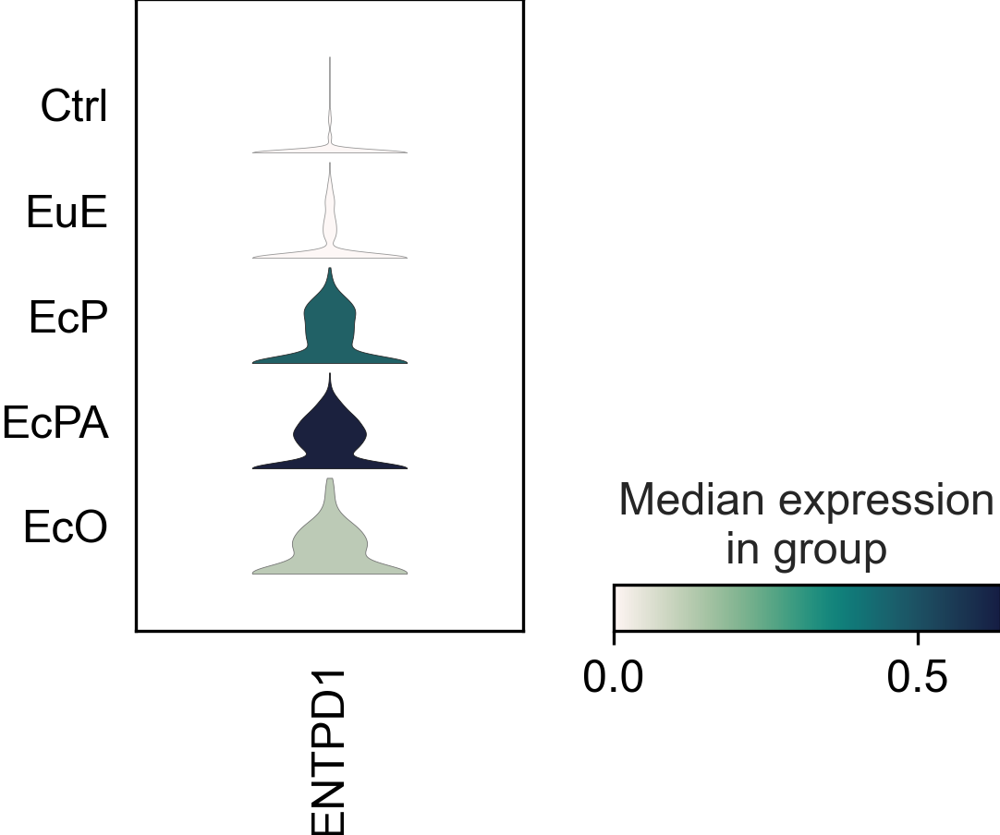

In [24]:

adata = lym[lym.obs.subtypes.str.contains("NK1")]
gene_to_plot = ["ENTPD1"]

f, ax = plt.subplots(1,1,figsize=(4,3))
cmap = cmo.cm.tempo
sc.pl.stacked_violin(adata[adata.obs.PID !="C04"], var_names=gene_to_plot, groupby="sample_type_rename", return_fig=False, 
                                 show=False,fontsize=8,figsize=(3,2), ax=ax, cmap=cmap )
save_figure(f,pdir="v4/Fig_5", name="5d. violin_ENTPD1-NK1")

---
**Fig 5e-i** representative images of TLS on tissue (HE / napari)

---
**Extended Data 7a** Lymphocytes tissue type distribution

computing density on 'umap'
--> added
    'umap_density_sample_type_rename', densities (adata.obs)
    'umap_density_sample_type_rename_params', parameter (adata.uns)
/home/tany/.conda/envs/endometriosis/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:365: MatplotlibDeprecationWarning: Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.
  cax = scatter(
EC19001-SC2100428/code/plot_funcs.py:37: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "bbox" which is no longer supported as of 3.3 and will become an error two minor releases later
  fig.savefig(out, dpi=dpi , bbox="tight")


Saved to UMAP-lym_density-green.pdf


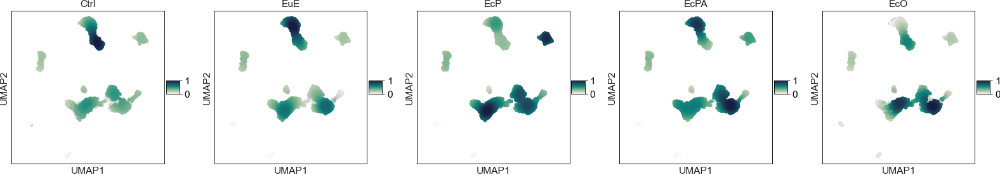

In [77]:
sc.tl.embedding_density(lym, basis='umap', groupby='sample_type_rename')
cmap = cmo.cm.tempo

fig = sc.pl.embedding_density(lym,basis="umap",key="umap_density_sample_type_rename",ncols=5,
                        color_map=cmap,
                        show=False,
                        bg_dotsize= 50, 
                        fg_dotsize= 100,return_fig=True)
fix_aspect_scatter_with_legend(fig)
save_figure(fig,pdir="v4/Fig_S10", name="UMAP-lym_density-green")

---
**Extended Data 7b** Lymphocytes cluster markers

In [25]:
NK = ["FCGR3A","KLRD1","ITGA1","LILRB1","ITGAX",
      "KLRC1","KLRC2","EPAS1","KIR2DL4","IGFBP2",
      "CD160","GZMH","KLRF1"] 

Tcells = ["FGFBP2","TBX21", #CTL
          "CD8A","CD8B","CRTAM","CCR5",
          "NCR3","RORC", #ILC
          "IL7R","TCF7", #Tcells
          "CD4","CCR7","SELL","LEF1", #Tn/cm (4)
          "FOXP3","CTLA4","IL2RA",#Treg,
          "CXCR6","ZNF683","ITGAE", #CD4 Trm
          "XCL1","ITGAE", #CD8 Trm
          "SLC4A10","DPP4","GZMK" #CD8 MAIT,
         ]

Bcells = ["IGKC","MZB1","DERL3","CD79A","CD79B","MS4A1","BANK1"]

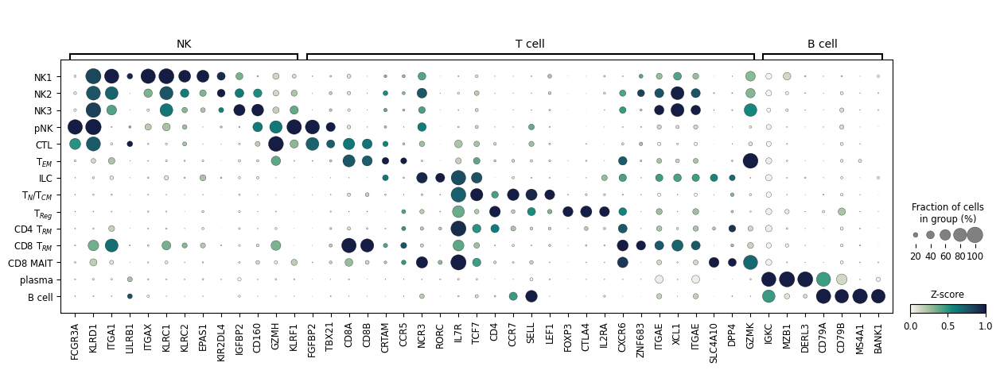

EC19001-SC2100428/code/plot_funcs.py:37: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "bbox" which is no longer supported as of 3.3 and will become an error two minor releases later
  fig.savefig(out, dpi=dpi , bbox="tight")


Saved to S10a. dotplot-lym_markers.pdf


In [27]:
import cmocean as cmo
cmap = cmo.cm.tempo

matplotlib.rcdefaults()
fig, ax = plt.subplots(1,1, figsize=(15,5))
sc.pl.dotplot(lym, var_names= NK + Tcells + Bcells, 
              groupby="subtypes", 
              var_group_labels = ["NK", "T cell", "B cell"],
              var_group_positions= [(0,12),(13,37),(38,44)],
              var_group_rotation= 0,
              standard_scale="var", 
              cmap=cmap, ax=ax,
              colorbar_title="Z-score")

save_figure(fig,pdir="v4/Fig_S10", name="S10a. dotplot-lym_markers")

---
**Extended Data 7c** CTLA4 expression in Treg

/home/tany/.conda/envs/endometriosis/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


Saved to S10b. props_CTLA4.pdf


EC19001-SC2100428/code/plot_funcs.py:37: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "bbox" which is no longer supported as of 3.3 and will become an error two minor releases later
  fig.savefig(out, dpi=dpi , bbox="tight")


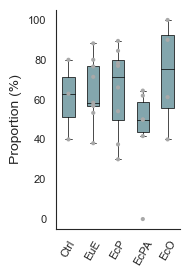

In [29]:
matplotlib.rcdefaults()
proportion_per_patient_barplot(lym[lym.obs.subtypes.str.contains("Reg")], gene="CTLA4",groupby="sample_type_rename",
                               bar_color=lym_palette[8],
                               filename = "S10b. props_CTLA4",figdir="v4/Fig_S10")

---
**Extended Data 7d** : TLS, GC markers

In [33]:
adata = lym[lym.obs.subtypes == "B cell"].copy()

In [17]:
proportion_per_patient_barplot(adata, gene="SEMA4A",groupby="sample_type_rename",bar_color="olivedrab",
                               filename = "S10b. props_SEMA4A",figdir="v4/Fig_S10")

SyntaxError: invalid syntax (<ipython-input-17-b50103650113>, line 2)

/home/tany/.conda/envs/endometriosis/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)
EC19001-SC2100428/code/plot_funcs.py:37: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "bbox" which is no longer supported as of 3.3 and will become an error two minor releases later
  fig.savefig(out, dpi=dpi , bbox="tight")


Saved to S10b. props_BCL6.pdf


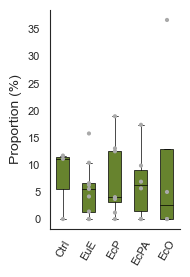

In [35]:
proportion_per_patient_barplot(adata, gene="BCL6",groupby="sample_type_rename",bar_color="olivedrab",
                               filename = "S10b. props_BCL6",figdir="v4/Fig_S10")

/home/tany/.conda/envs/endometriosis/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)
EC19001-SC2100428/code/plot_funcs.py:37: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "bbox" which is no longer supported as of 3.3 and will become an error two minor releases later
  fig.savefig(out, dpi=dpi , bbox="tight")


Saved to S10b. props_CXCR5.pdf


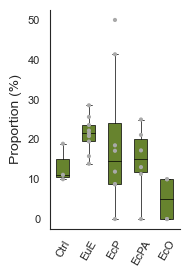

In [37]:
proportion_per_patient_barplot(adata, gene="CXCR5",groupby="sample_type_rename",bar_color="olivedrab",
                               filename = "S10b. props_CXCR5",figdir="v4/Fig_S10")

---
**Fig 6a** UMAP of epithelial clusters

-- use previously generated UMAP for Fig 1d

---
**Fig 6b**: Epi tissue type distribution

In [18]:
sc.tl.embedding_density(epi, basis='umap', groupby='sample_type_rename')

computing density on 'umap'
--> added
    'umap_density_sample_type_rename', densities (adata.obs)
    'umap_density_sample_type_rename_params', parameter (adata.uns)


/home/tany/.conda/envs/endometriosis/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:365: MatplotlibDeprecationWarning: Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.
  cax = scatter(
EC19001-SC2100428/code/plot_funcs.py:37: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "bbox" which is no longer supported as of 3.3 and will become an error two minor releases later
  fig.savefig(out, dpi=dpi , bbox="tight")


Saved to S11a. UMAP-epi_density-blue.pdf


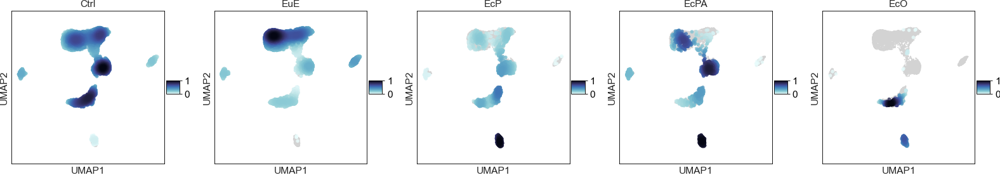

In [26]:
cmap = cmo.tools.lighten(cmo.cm.ice_r, 0.8)

fig = sc.pl.embedding_density(epi,basis="umap",key="umap_density_sample_type_rename",ncols=5,
                        color_map=cmap,
                        show=False,
                        bg_dotsize= 10, 
                        fg_dotsize= 100,return_fig=True)
fix_aspect_scatter_with_legend(fig)
save_figure(fig,pdir="v4/Fig_S11", name="S11a. UMAP-epi_density-blue")

---
**Fig 6c**: epi marker genes 

In [50]:
ciliated = ["TPPP3","PIFO","FOXJ1"] #2
progenitors = ["TP63","KRT5","SOX9","LGR5","LY6E","MUC5B","TFF3","RUNX3","SAA1","IGFBP3"] #13
glands = ['KIAA1324','SPDEF',"SMAD9",'CD36',"HSD17B2","SCGB2A2"] #18
lum =  ["GDA","FGFR2",'WNT7A','FGF9','LGR5',"PTGS1"] #26

add = ["MSLN","UPK3B","CALB2"] #28

phase1_pro = ["PGR","ESR1","MMP7","TIMP1"] #33
phase2_pro = ["IDO1","PSAT1","ENPP3","GNG11","CREB3L1","IHH","TOP2A"] #39
early_sec = ["MT1F","MT1E","MT1X","SERPINA5"] #41
mid_sec = ["SPP1","PAEP","CXCL14","DPP4"] #45
mc = phase1_pro+phase2_pro+early_sec+mid_sec

In [58]:
epi.obs["subtypes"].cat.reorder_categories([
    "MUC5B+","TP63+/KRT5+","glandular","glandular early-secretory","lumenal",
    "lumenal 1","lumenal 2","mid-secretory","ciliated", "mesothelial"
],
    inplace=True)

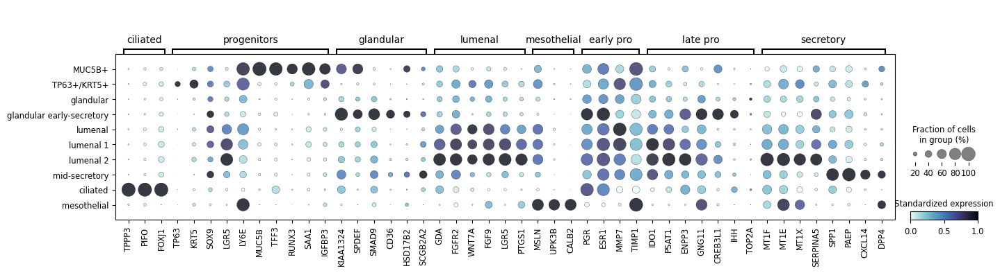

EC19001-SC2100428/code/plot_funcs.py:37: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "bbox" which is no longer supported as of 3.3 and will become an error two minor releases later
  fig.savefig(out, dpi=dpi , bbox="tight")


Saved to 6b. dotplot-epi_markers.pdf


In [60]:
matplotlib.rcdefaults()
import cmocean as cmo
cmap = cmo.tools.lighten(cmo.cm.ice_r, 0.8)
fig, ax = plt.subplots(1,1, figsize=(16,4))
sc.pl.dotplot(epi, 
              var_names=ciliated+progenitors+glands+lum+add+mc,
              use_raw=False, 
              groupby="subtypes",
              var_group_labels=["ciliated","progenitors","glandular","lumenal","mesothelial","early pro", 
                                "late pro","secretory"],
              var_group_positions=[(0,2),(3,12),(13,18),(19,24),(25,27),(28,31),(32,38),(39,46)], 
              var_group_rotation=0,
              cmap= cmap,ax=ax,
              standard_scale="var",colorbar_title="Standardized expression",
              )

save_figure(fig,pdir="v4/Fig_6", name="6b. dotplot-epi_markers")

---
**Fig 6d**: IF/ IHC staining for MUC5B (microscope image)

---
**Fig 6e**: FPR2 in global and mye

EC19001-SC2100428/code/plot_funcs.py:37: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "bbox" which is no longer supported as of 3.3 and will become an error two minor releases later
  fig.savefig(out, dpi=dpi , bbox="tight")


Saved to S11e. UMAP-main-FPR2-exp.pdf


EC19001-SC2100428/code/plot_funcs.py:37: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "bbox" which is no longer supported as of 3.3 and will become an error two minor releases later
  fig.savefig(out, dpi=dpi , bbox="tight")


Saved to S11e. UMAP-mye-FPR2-exp.pdf


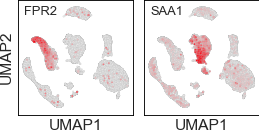

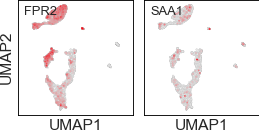

In [50]:
from plot_funcs import scatter_1by2

scatter_1by2(main, ["FPR2","SAA1"],markersize=10,
             filename="S11e. UMAP-main-FPR2-exp",
             figdir="v4/Fig_S11"
            )

scatter_1by2(mye, ["FPR2","SAA1"],markersize=10,
             filename="S11e. UMAP-mye-FPR2-exp",
             figdir="v4/Fig_S11"
            )

---
**Fig 6f**: brightfield organoid images

---
**Fig 6g**: UMAP of organoid + in vivo and the distributions

/home/tany/.conda/envs/endometriosis/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)
Trying to set attribute `.uns` of view, copying.
Trying to set attribute `.uns` of view, copying.
<ipython-input-25-bba12ed7a6bc>:43: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout(rect=(0.025, 0.025, 0.95, 0.95))
EC19001-SC2100428/code/plot_funcs.py:37: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "bbox" which is no longer supported as of 3.3 and will become an error two minor releases later
  fig.savefig(out, dpi=dpi , bbox="tight")


Saved to 6f. org_distribution.pdf


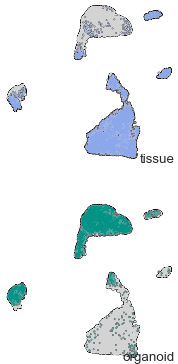

In [25]:
#how's the cells distribution looks like?
fig = plt.figure(figsize=(6,6), facecolor="white")
gs = plt.GridSpec(2, 2,wspace=0.1)
ax1 = fig.add_subplot(gs[0, 0])
ax2 = fig.add_subplot(gs[1, 0])
#ax3 = fig.add_subplot(gs[0, 2])
#ax4 = fig.add_subplot(gs[0, 3])
#ax5 = fig.add_subplot(gs[0, 4])
axs = [ax1,ax2]

main_cluster = org.copy()
params = dict(show=False, title="", add_outline=True, legend_loc=None)
biopsy_origins = "tissue","organoid","coculture"
number_of_cells = "EuC","EuE","EcP","EcPA","EcO"
sample_type_palette=[blues_2[6],get_xkcd[4]]

for k in range(len(axs)):
    ax = axs[k]
    sc.pl.umap(
        main_cluster, s=10, frameon= False,
        ax=ax,
        **params
    ) 
    biopsys = biopsy_origins[k]
    n_cells = number_of_cells[k]
    sc.pl.umap(
        main_cluster[main_cluster.obs.source.isin([biopsys])], s=3,
        color="source", frameon= False,
        palette=[sample_type_palette[k]],
        ax=ax,
        **params
    )
    ax.set_xlabel("")
    ax.set_ylabel("")
    ax.text(0.98, 0.02, biopsys, transform=ax.transAxes, ha="right", fontsize=12)
    #ax.text(0.98, 0.94, n_cells, transform=ax.transAxes, ha="right", fontsize=14)
ax2.set_xlabel("UMAP1",)
ax1.set_ylabel("UMAP2")
ax2.set_ylabel("UMAP2")
#ax3.set_xlabel("UMAP1")
#ax4.set_xlabel("UMAP1")
#ax5.set_xlabel("UMAP1")
fig.tight_layout(rect=(0.025, 0.025, 0.95, 0.95))
#fig.savefig("u01_umap.png", bbox_inches="tight", dpi=300)
save_figure(fig,pdir="v4/Fig_6", name="6f. org_distribution",ext="pdf",dpi=1200)

In [34]:
#add new_subtypes, if needed
org.obs["new_subtypes"] = org.obs["leiden_org_epi"].map({
    "7":"TP63+/KRT5+",
    "0":"EEO",
    "1":"lumenal",
    "5":"MUC5B+",
    "3":"ciliated",
    "4":"mid-secretory",
    "2":"glandular early-secretory",
    "6":"cycling",
}).astype("category")

org.obs["new_subtypes"].cat.reorder_categories([
    "EEO","MUC5B+","TP63+/KRT5+","cycling","glandular early-secretory",
    "mid-secretory","lumenal","ciliated"], 
inplace = True)

EC19001-SC2100428/code/plot_funcs.py:37: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "bbox" which is no longer supported as of 3.3 and will become an error two minor releases later
  fig.savefig(out, dpi=dpi , bbox="tight")


Saved to 6f. UMAP org subtypes.pdf


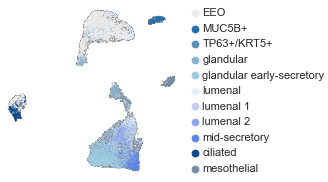

In [24]:
sc.set_figure_params(scanpy=True, vector_friendly=True, facecolor=None)
fig, ax = plt.subplots(1,1, figsize=(5,3))
sc.pl.umap(org, 
           color = ["subtypes"],legend_fontsize= 10,title="",
           palette=org_palette,
           add_outline=True, s=2,
           outline_color=("black","lightgrey"),
           outline_width=(0.2,0.05),
           frameon=False,
           show=False,
           ax=ax)
fix_aspect_scatter_with_legend(fig)
save_figure(fig,pdir="v4/Fig_6", name="6f. UMAP org subtypes",)

---
**Extended Data 8a**: props epithelial 

EC19001-SC2100428/code/plot_funcs.py:551: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations. 
  fig.tight_layout()


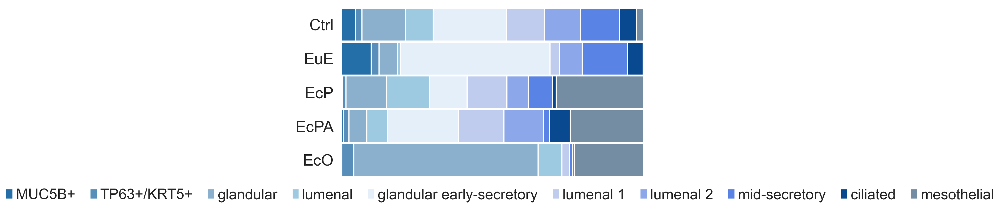

In [56]:
from plot_funcs import plot_celltype_proportions

sns.set_style("white")
props = get_cluster_proportions(epi, cluster_key="subtypes",sample_key="sample_type_rename")
fig = plot_celltype_proportions(props,cluster_palette=epi_palette);
save_figure(fig,pdir="v4/Fig_S11", name="S11b. props_epi-subtypes")

In [57]:
props

subtypes,MUC5B+,TP63+/KRT5+,glandular,lumenal,glandular early-secretory,lumenal 1,lumenal 2,mid-secretory,ciliated,mesothelial
sample_type_rename,,,,,,,,,,
Ctrl,4.662267,2.106446,14.464261,9.099846,24.378599,12.498245,12.006741,12.877405,5.589103,2.317090
EuE,9.861857,2.545408,6.139678,1.061653,49.437196,3.261704,7.405986,14.965464,5.269890,0.051164
EcP,0.272232,1.225045,13.339383,14.337568,12.431942,13.157895,7.123412,7.940109,1.315789,28.856624
EcPA,0.595238,1.851852,5.952381,6.878307,23.478836,15.013228,13.161376,1.984127,6.878307,24.206349
EcO,0.000000,4.036697,61.100917,7.889908,0.000000,2.568807,0.000000,0.917431,0.550459,22.935780


---
**Extended Data 8b**: repsentative images of MUC5B expression on tissue IMC (napari)

---
**Extended Data 8c**: SAA1/MUC5B expression in MUC5B+ subpopulation

/home/tany/.conda/envs/endometriosis/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


Saved to S111b. props_MUC5B.pdf


EC19001-SC2100428/code/plot_funcs.py:37: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "bbox" which is no longer supported as of 3.3 and will become an error two minor releases later
  fig.savefig(out, dpi=dpi , bbox="tight")


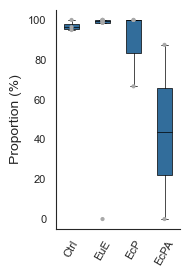

In [30]:
proportion_per_patient_barplot(epi[epi.obs.subtypes == "MUC5B+"], gene="MUC5B",groupby="sample_type_rename",
                               bar_color=epi_palette[0],
                               filename = "S111b. props_MUC5B",figdir="v4/Fig_S11")

/home/tany/.conda/envs/endometriosis/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


Saved to S11b. props_SAA1.pdf


EC19001-SC2100428/code/plot_funcs.py:37: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "bbox" which is no longer supported as of 3.3 and will become an error two minor releases later
  fig.savefig(out, dpi=dpi , bbox="tight")


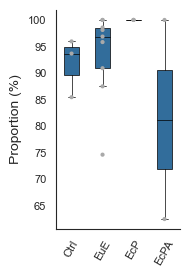

In [31]:
proportion_per_patient_barplot(epi[epi.obs.subtypes == "MUC5B+"], gene="SAA1",groupby="sample_type_rename",
                               bar_color=epi_palette[0],
                               filename = "S11b. props_SAA1",figdir="v4/Fig_S11")

---
**Extended Data 9a**: organoid dataset metrics

Bill generated the figure and saved it in `/figures/manuscript-bill`

---
**Extended Data 9b** organoid tissue type distribution

computing density on 'umap'
--> added
    'umap_density_sample_type_rename', densities (adata.obs)
    'umap_density_sample_type_rename_params', parameter (adata.uns)
EC19001-SC2100428/code/plot_funcs.py:37: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "bbox" which is no longer supported as of 3.3 and will become an error two minor releases later
  fig.savefig(out, dpi=dpi , bbox="tight")


Saved to UMAP-org_density-blue.pdf


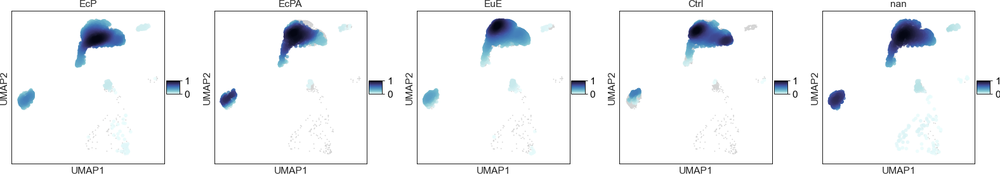

In [110]:
adata = org[org.obs.source != "tissue"].copy()

cmap = cmo.tools.lighten(cmo.cm.ice_r, 0.8)

sc.tl.embedding_density(adata, basis='umap', groupby='sample_type_rename')
fig = sc.pl.embedding_density(adata,basis="umap",key="umap_density_sample_type_rename",ncols=5,
                        color_map=cmap,
                        show=False,
                        bg_dotsize= 10, 
                        fg_dotsize= 100,return_fig=True)
fix_aspect_scatter_with_legend(fig)
save_figure(fig,pdir="v4/Fig_S11", name="UMAP-org_density-blue")

---
**Extended Data 9c**: UMAP org-MUC5B+ cells marker gene expression similarities

EC19001-SC2100428/code/plot_funcs.py:37: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "bbox" which is no longer supported as of 3.3 and will become an error two minor releases later
  fig.savefig(out, dpi=dpi , bbox="tight")


Saved to UMAP-org-markers.pdf


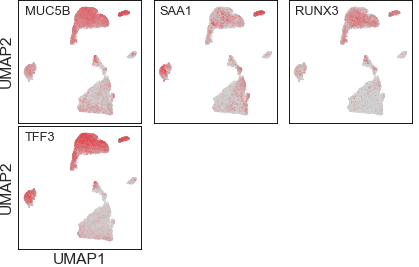

In [27]:
from plot_funcs import scatter_2by3
sc.set_figure_params(scanpy=True, vector_friendly=True, facecolor=None)
scatter_2by3(org, ["MUC5B","SAA1","RUNX3","TFF3"],markersize=3,
             filename="UMAP-org-markers",
             figdir="v4/Fig_S12",ext="pdf"
            )

---
**Extended Data 10a**: Flow Cytometry gating strategy for MUC5B+/MUC5B- cell sorting <br>
**Extended Data 10b**: brightfield images of organoid growth after seeding <br>
**Extended Data 10c**: Area & Counts of organoids <br>
**Extended Data 10d**: MUC5B expression in the organoids generated from MUC5B+/MUC5B- cells

---
**additional panels**:density plot for all stromal (not included in manuscript)

computing density on 'umap'
--> added
    'umap_density_sample_type_rename', densities (adata.obs)
    'umap_density_sample_type_rename_params', parameter (adata.uns)
EC19001-SC2100428/code/plot_funcs.py:37: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "bbox" which is no longer supported as of 3.3 and will become an error two minor releases later
  fig.savefig(out, dpi=dpi , bbox="tight")


Saved to UMAP-stro_density-yellow.pdf


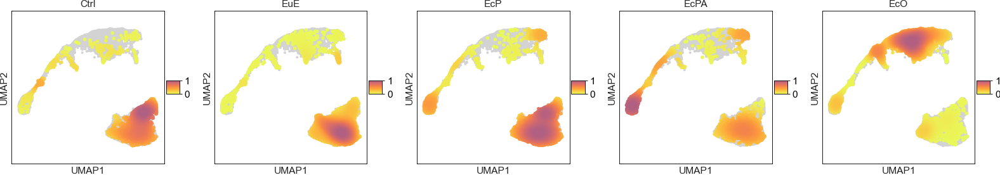

In [75]:
sc.tl.embedding_density(stro, basis='umap', groupby='sample_type_rename')
cmap = cmo.tools.crop_by_percent(cmo.cm.thermal_r, 50, which='max', N=None)

fig = sc.pl.embedding_density(stro,basis="umap",key="umap_density_sample_type_rename",ncols=5,
                        color_map=cmap,
                        show=False,
                        bg_dotsize= 50, 
                        fg_dotsize= 100,return_fig=True)
fix_aspect_scatter_with_legend(fig)
save_figure(fig,pdir="v4/Fig_S5", name="UMAP-stro_density-yellow")

---

**NOTEBOOK ENDS HERE**